# Exploratory Data Analysis

## Load the required libraries


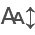

In [1]:
import pickle
import os
import numpy as np
import pandas as pd

pd.options.display.float_format = '{:,.2f}'.format

# Statistical libraries
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Visualization libraries
from itables import init_notebook_mode, show
init_notebook_mode(all_interactive=True)
import matplotlib.pyplot as plt
import seaborn as sns

# Time series analysis libraries
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss


# Supress warnings
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)


In [2]:
# Custom Function for creating a data dictionary 
def data_dictionary(df):
    # Create a data dictionary of the data-types
    datadict = pd.DataFrame(df.dtypes)
    # Rename the Data Type Column 
    datadict = datadict.rename(columns={0:'DataType'})
    # Add a count of missing values
    datadict['MissingVal'] = df.isnull().sum()
    # Add the number of unique values for each attribute (objects count the levels)
    datadict['NUnique']=df.nunique()
    # Add a count for each attribute
    datadict['Count']=df.count()        
    return (datadict)


## Load the Pickle Files

In [3]:
# Create a list of pickle files to load
pickle_files = [#'all_weather_data.pkl', 
                'all_weather_data_daily.pkl', 
                #'all_weather_data_pivot.pkl', 
                'avg_NO2_daily.pkl', 
                'fips_site_locations.pkl']

# Open each pickle file and load the data based on the file name

for file in pickle_files:
    with open(file, 'rb') as f:
        if file == 'all_weather_data_daily.pkl':
            all_weather_data_daily = pickle.load(f)
        #elif file == 'all_weather_data.pkl':
        #    all_weather_data = pickle.load(f)
        elif file == 'avg_NO2_daily.pkl':
            avg_NO2_daily = pickle.load(f)
        elif file == 'fips_site_locations.pkl':
            fips_site_locations = pickle.load(f)


## $NO_2$ Data Exploration

### Structure and Types

In [4]:
print(data_dictionary(avg_NO2_daily))


                    DataType  MissingVal  NUnique  Count
fips                  object           0       24  86165
fips_site           category           0       57  86165
latitude             float32           0       57  86165
longitude            float32           0       57  86165
NO2_concentration    float32           0    22955  86165
metro_area          category           0        5  86165
month_year         period[M]           0       60  86165
year                   int32           0        5  86165
week_of_year          UInt32           0       53  86165
day_of_year            int32           0      366  86165
day_of_week           object           0        7  86165
day_of_week_num        int32           0        7  86165
day_of_week_sin      float64           0        7  86165
day_of_week_cos      float64           0        7  86165
weekday               object           0        2  86165
day_of_year_sin      float64           0      366  86165
day_of_year_cos      float64   

In [5]:
# The function below was created specifically for the one-way ANOVA table results returned for Type II sum of squares
# https://www.pythonfordatascience.org/anova-python/
def anova_table(aov):
    aov['mean_sq'] = aov[:]['sum_sq']/aov[:]['df']
    aov['eta_sq'] = aov[:-1]['sum_sq']/sum(aov['sum_sq'])
    aov['omega_sq'] = (aov[:-1]['sum_sq']-(aov[:-1]['df']*aov['mean_sq'][-1]))/(sum(aov['sum_sq'])+aov['mean_sq'][-1])

    cols = ['sum_sq', 'df', 'mean_sq', 'F', 'PR(>F)', 'eta_sq', 'omega_sq']
    aov = aov[cols]
    return aov


In [6]:
"""
# ANOVA Test and Results
ols_model = ols('NO2_concentration ~ C(metro_area)', data=avg_NO2_daily).fit()
aov_table_aov = sm.stats.anova_lm(ols_model)


aov = anova_table(aov_table_aov)
print(aov)

#Examination of coefficients
coefficients = ols_model.params
print(coefficients)

tukey = pairwise_tukeyhsd(endog=avg_NO2_daily['NO2_concentration'],
                          groups=avg_NO2_daily['metro_area'],
                          alpha=0.05)
print(tukey)
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
tukey_simple= tukey_df[['group1', 'group2','meandiff']]
df_pivoted = tukey_simple.pivot_table(index='group1', columns='group2',values = 'meandiff', aggfunc='mean')

# Create the heatmap
sns.heatmap(data=df_pivoted, annot=True, fmt='.1f')

# Set the title and labels
plt.title('Tukey Mean Difference Test for NO2 Concentration by Year')
plt.xlabel('Year')
plt.ylabel('Year')

# Show the plot
plt.show()"""


"\n# ANOVA Test and Results\nols_model = ols('NO2_concentration ~ C(metro_area)', data=avg_NO2_daily).fit()\naov_table_aov = sm.stats.anova_lm(ols_model)\n\n\naov = anova_table(aov_table_aov)\nprint(aov)\n\n#Examination of coefficients\ncoefficients = ols_model.params\nprint(coefficients)\n\ntukey = pairwise_tukeyhsd(endog=avg_NO2_daily['NO2_concentration'],\n                          groups=avg_NO2_daily['metro_area'],\n                          alpha=0.05)\nprint(tukey)\ntukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])\ntukey_simple= tukey_df[['group1', 'group2','meandiff']]\ndf_pivoted = tukey_simple.pivot_table(index='group1', columns='group2',values = 'meandiff', aggfunc='mean')\n\n# Create the heatmap\nsns.heatmap(data=df_pivoted, annot=True, fmt='.1f')\n\n# Set the title and labels\nplt.title('Tukey Mean Difference Test for NO2 Concentration by Year')\nplt.xlabel('Year')\nplt.ylabel('Year')\n\n# Show the plot\nplt.show()"

ANOVA Results for Los Angeles:
               sum_sq        df  mean_sq     F  PR(>F)  eta_sq  omega_sq
C(fips)      4,957.03      1.00 4,957.03 60.22    0.00    0.00      0.00
Residual 2,553,869.38 31,027.00    82.31   NaN     NaN     NaN       NaN


Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj lower  upper  reject
-------------------------------------------------
 06037  06059   1.0414   0.0 0.7784 1.3044   True
-------------------------------------------------


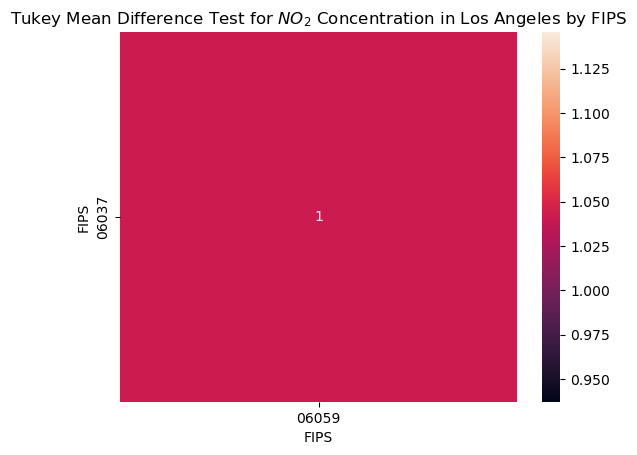

ANOVA Results for New York:
               sum_sq        df   mean_sq      F  PR(>F)  eta_sq  omega_sq
C(fips)    343,591.88      8.00 42,948.99 833.60    0.00    0.25      0.25
Residual 1,006,593.31 19,537.00     51.52    NaN     NaN     NaN       NaN




c:\Users\adams\anaconda3\Lib\site-packages\scipy\integrate\_quadpack_py.py:1272: IntegrationWarning: The integral is probably divergent, or slowly convergent.
  quad_r = quad(f, low, high, args=args, full_output=self.full_output,


 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
 34003  34013  -1.4564    0.0  -2.1966  -0.7161   True
 34003  34017   0.6441 0.0517  -0.0023   1.2904  False
 34003  34023  -8.2775    0.0  -9.0182  -7.5368   True
 34003  34027 -12.5644    0.0 -13.3647  -11.764   True
 34003  34039   2.8485    0.0   2.1083   3.5888   True
 34003  36005  -1.3941    0.0  -2.0382  -0.7499   True
 34003  36081  -1.4414    0.0  -2.0849  -0.7979   True
 34003  36103 -12.6449    0.0 -13.8843 -11.4054   True
 34013  34017   2.1004    0.0   1.4551   2.7457   True
 34013  34023  -6.8211    0.0  -7.5609  -6.0814   True
 34013  34027  -11.108    0.0 -11.9075 -10.3085   True
 34013  34039   4.3049    0.0   3.5655   5.0442   True
 34013  36005   0.0623    1.0  -0.5808   0.7054  False
 34013  36081    0.015    1.0  -0.6275   0.6574  False
 34013  36103 -11.1885    0.0 -12.4274  -9.9496   True
 34017  34

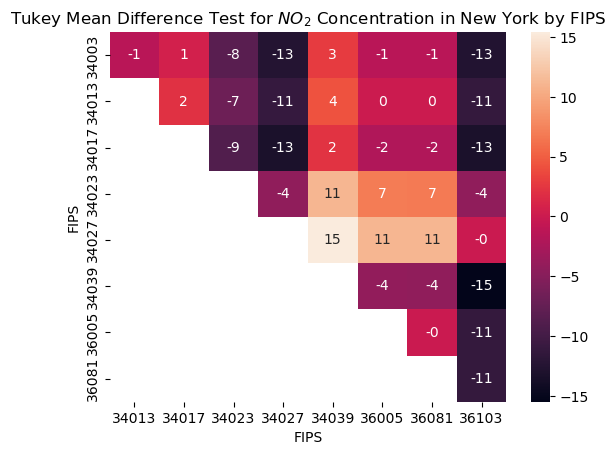

ANOVA Results for Washington:
             sum_sq        df   mean_sq        F  PR(>F)  eta_sq  omega_sq
C(fips)  174,872.73      5.00 34,974.55 1,175.08    0.00    0.27      0.26
Residual 484,996.89 16,295.00     29.76      NaN     NaN     NaN       NaN


 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
 11001  24033  -4.9348    0.0  -5.3434  -4.5262   True
 11001  51013  -2.2422    0.0  -2.6504  -1.8341   True
 11001  51059    3.851    0.0   3.4436   4.2585   True
 11001  51107  -5.2543    0.0  -5.6642  -4.8444   True
 11001  51153  -7.2731    0.0  -7.6832  -6.8631   True
 24033  51013   2.6925    0.0   2.1758   3.2093   True
 24033  51059   8.7858    0.0   8.2696    9.302   True
 24033  51107  -0.3195 0.4936  -0.8377   0.1986  False
 24033  51153  -2.3384    0.0  -2.8567  -1.8201   True
 51013  51059   6.0932    0.0   5.5774   6.6091   True
 51013  51107  -3.0121    0.

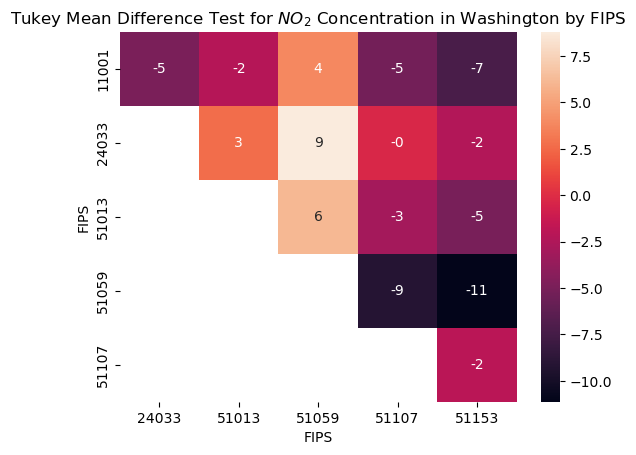

ANOVA Results for Denver:
             sum_sq       df    mean_sq        F  PR(>F)  eta_sq  omega_sq
C(fips)  316,449.70     3.00 105,483.23 1,340.15    0.00    0.29      0.29
Residual 776,474.38 9,865.00      78.71      NaN     NaN     NaN       NaN


 Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj   lower    upper   reject
------------------------------------------------------
 08001  08031   5.4662    0.0   4.8541   6.0784   True
 08001  08059  -12.396    0.0 -13.3271  -11.465   True
 08001  08093 -14.2875    0.0 -16.2908 -12.2842   True
 08031  08059 -17.8623    0.0 -18.6615  -17.063   True
 08031  08093 -19.7538    0.0 -21.6993 -17.8082   True
 08059  08093  -1.8915 0.0871  -3.9597   0.1767  False
------------------------------------------------------


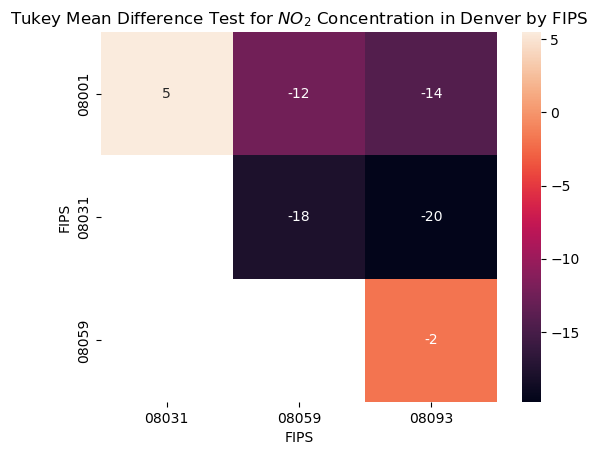

ANOVA Results for Chicago:
             sum_sq       df   mean_sq      F  PR(>F)  eta_sq  omega_sq
C(fips)   73,242.40     2.00 36,621.20 873.68    0.00    0.16      0.16
Residual 394,722.91 9,417.00     41.92    NaN     NaN     NaN       NaN


 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
 17031  18089  -5.4567   0.0  -5.8683   -5.045   True
 17031  55059 -12.0127   0.0 -12.9396 -11.0857   True
 18089  55059   -6.556   0.0  -7.5394  -5.5726   True
-----------------------------------------------------


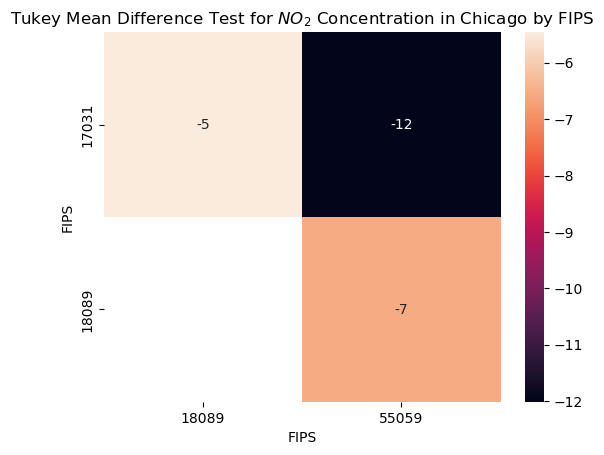

In [7]:
# Create a for loop by metro area to do the same ANOVA above using fips_site instead of metro_area
for metro_area in avg_NO2_daily['metro_area'].unique():
    # Filter the DataFrame for the current metro area
    metro_area_data = avg_NO2_daily[avg_NO2_daily['metro_area'] == metro_area]
    
    # Perform one-way ANOVA
    ols_model = ols('NO2_concentration ~ C(fips)', data=metro_area_data).fit()
    aov_table = sm.stats.anova_lm(ols_model, typ=2)
    
    # Print the ANOVA table for the current metro area
    print(f"ANOVA Results for {metro_area}:")
    print(anova_table(aov_table))
    print("\n")

    tukey = pairwise_tukeyhsd(endog=metro_area_data['NO2_concentration'],
                          groups=metro_area_data['fips'],
                          alpha=0.05)
    print(tukey)
    tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
    tukey_simple= tukey_df[['group1', 'group2','meandiff']]
    df_pivoted = tukey_simple.pivot_table(index='group1', columns='group2',values = 'meandiff', aggfunc='mean')

    # Create the heatmap
    sns.heatmap(data=df_pivoted, annot=True, fmt='.0f')

    # Set the title and labels
    plt.title(r'Tukey Mean Difference Test for $NO_2$ Concentration in ' + metro_area + ' by FIPS')
    plt.xlabel('FIPS')
    plt.ylabel('FIPS')

    # Show the plot
    plt.show()


### Determine if the $NO_2$ Data is Different by Metro Area

                    sum_sq        df   mean_sq        F  PR(>F)  eta_sq  \
C(metro_area)   358,843.65      4.00 89,710.91 1,231.26    0.00    0.09   
Residual      3,662,515.21 50,267.00     72.86      NaN     NaN     NaN   

               omega_sq  
C(metro_area)      0.09  
Residual            NaN  
Intercept                      14.33
C(metro_area)[T.Denver]         5.09
C(metro_area)[T.Los Angeles]    0.41
C(metro_area)[T.New York]       0.48
C(metro_area)[T.Washington]    -4.58
dtype: float64
      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
   group1      group2   meandiff p-adj   lower    upper  reject
---------------------------------------------------------------
    Chicago      Denver   5.0922    0.0   4.6399  5.5445   True
    Chicago Los Angeles   0.4109 0.0229   0.0369  0.7849   True
    Chicago    New York   0.4811  0.008   0.0857  0.8765   True
    Chicago  Washington  -4.5787    0.0  -4.9857 -4.1718   True
     Denver Los Angeles  -4.6813    0.0   -5.034

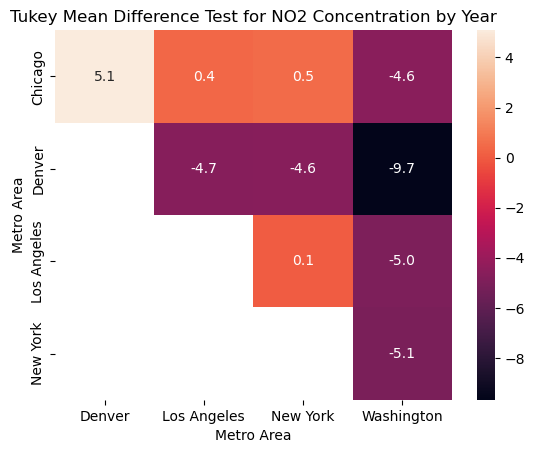

In [8]:
# Remove the index from the data
avg_NO2_daily.reset_index(inplace=True)
# Remove 2020 and 2021 from the data to account for potential COVID-19 effects by region
avg_NO2_preC = avg_NO2_daily[~avg_NO2_daily['date_local'].dt.year.isin([2020, 2021])]

# Perform one-way ANOVA for the remaining years
ols_model = ols('NO2_concentration ~ C(metro_area)', data=avg_NO2_preC).fit()
aov_table_aov = sm.stats.anova_lm(ols_model)
# The function below was created specifically for the one-way ANOVA table results returned for Type II sum of squares
# https://www.pythonfordatascience.org/anova-python/
def anova_table(aov):
    aov['mean_sq'] = aov[:]['sum_sq']/aov[:]['df']
    aov['eta_sq'] = aov[:-1]['sum_sq']/sum(aov['sum_sq'])
    aov['omega_sq'] = (aov[:-1]['sum_sq']-(aov[:-1]['df']*aov['mean_sq'][-1]))/(sum(aov['sum_sq'])+aov['mean_sq'][-1])

    cols = ['sum_sq', 'df', 'mean_sq', 'F', 'PR(>F)', 'eta_sq', 'omega_sq']
    aov = aov[cols]
    return aov

aov = anova_table(aov_table_aov)
print(aov)

#Examination of coefficients
coefficients = ols_model.params
print(coefficients)

# Tukey's HSD test for multiple comparisons
tukey = pairwise_tukeyhsd(endog=avg_NO2_preC['NO2_concentration'],
                          groups=avg_NO2_preC['metro_area'],
                          alpha=0.05)
print(tukey)
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
tukey_simple= tukey_df[['group1', 'group2','meandiff']]
df_pivoted = tukey_simple.pivot_table(index='group1', columns='group2',values = 'meandiff', aggfunc='mean')

# Create the heatmap
sns.heatmap(data=df_pivoted, annot=True, fmt='.1f')
# Set the title and labels
plt.title('Tukey Mean Difference Test for NO2 Concentration by Year')
plt.xlabel('Metro Area')
plt.ylabel('Metro Area')
# Show the plot
plt.show()


### $NO_2$ Concentration Summary Statistics

In [9]:
# Calcualte the min, max, quartile ranges, mean, and standard deviation of the arithmetic mean of the NO2
avg_NO2_daily['NO2_concentration'].describe()


count   86,165.00
mean        13.74
std          8.79
min          1.00
25%          7.00
50%         12.03
75%         18.72
max         70.62
Name: NO2_concentration, dtype: float64

### Set date-time for plotting and time-series analysis

In [10]:
# Set the date column to datetime format
avg_NO2_daily['date_local'] = pd.to_datetime(avg_NO2_daily['date_local'])
# Set the date column as the index
avg_NO2_daily.set_index('date_local', inplace=True)

# Create a column for month and year
avg_NO2_daily['month_year'] = avg_NO2_daily.index.to_period('M')
# Create a column for year
avg_NO2_daily['year'] = avg_NO2_daily.index.year

# Add a column for the day of the week
avg_NO2_daily['day_of_week'] = avg_NO2_daily.index.day_name()
# Add a column for the day of the week number
avg_NO2_daily['day_of_week_num'] = avg_NO2_daily.index.dayofweek
# Add a column for the day of the year as a sin function
avg_NO2_daily['day_of_week_sin'] = np.sin(2 * np.pi * avg_NO2_daily['day_of_week_num'] / 7)
# Add a column for the day of the year as a cos function
avg_NO2_daily['day_of_week_cos'] = np.cos(2 * np.pi * avg_NO2_daily['day_of_week_num'] / 7)

# Add a column for the day of the year
avg_NO2_daily['day_of_year'] = avg_NO2_daily.index.dayofyear

# Add a column for the day of the year as a sin function
avg_NO2_daily['day_of_year_sin'] = np.sin(2 * np.pi * avg_NO2_daily['day_of_year'] / 365.25)
# Add a column for the day of the year as a cos function
avg_NO2_daily['day_of_year_cos'] = np.cos(2 * np.pi * avg_NO2_daily['day_of_year'] / 365.25)

# Sort the data by date_local
avg_NO2_daily.sort_index(inplace=True)


### Summary of the Data

In [11]:
# Create a table of number of observations by year and by metro area
avg_NO2_count = avg_NO2_daily.groupby(['year', 'metro_area'], observed=True).agg({'NO2_concentration': 'count'}).reset_index()
# Rename the columns for clarity
avg_NO2_count.columns = ['year', 'metro_area', 'count']
# Set the year column as the index
avg_NO2_count.set_index('year', inplace=True)
# Create a pivot table for the number of observations by year and metro area
avg_NO2_count_pivot = avg_NO2_count.pivot_table(index='year', columns='metro_area', values='count', observed=True)
# Fill missing values with 0
avg_NO2_count_pivot.fillna(0, inplace=True)

# Print the results
print("Number of observations by year and metro area:")
print(avg_NO2_count_pivot)

#show(avg_NO2_count_pivot)


Number of observations by year and metro area:
metro_area  Chicago   Denver  Los Angeles  New York  Washington
year                                                           
2017       1,802.00 1,904.00     6,054.00  3,780.00    3,275.00
2018       1,309.00 1,739.00     5,947.00  3,799.00    3,246.00
2019       1,818.00 2,092.00     6,155.00  4,120.00    3,232.00
2020       2,196.00 2,098.00     6,483.00  3,880.00    3,283.00
2021       2,295.00 2,036.00     6,390.00  3,967.00    3,265.00


In [12]:
# Create a table of average NO2 concentrations by year and by metro area
avg_NO2_mean = avg_NO2_daily.groupby(['year', 'metro_area'], observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_mean.columns = ['year', 'metro_area', 'mean_NO2_concentration']
# Set the year column as the index
avg_NO2_mean.set_index('year', inplace=True)
# Create a pivot table for the average NO2 concentrations by year and metro area
avg_NO2_mean_pivot = avg_NO2_mean.pivot_table(index='year', columns='metro_area', values='mean_NO2_concentration', observed=True)
# Fill missing values with 0
avg_NO2_mean_pivot.fillna(0, inplace=True)

# Print the results 
print("Average NO2 concentrations by year and metro area:")
print(avg_NO2_mean_pivot)
#show(avg_NO2_mean_pivot)


Average NO2 concentrations by year and metro area:
metro_area  Chicago  Denver  Los Angeles  New York  Washington
year                                                          
2017          14.00   19.51        15.59     15.07        9.81
2018          14.84   20.75        14.89     15.02        9.44
2019          14.28   18.23        13.76     14.37       10.00
2020          12.65   16.36        13.82     13.27        8.29
2021          13.47   16.54        13.84     13.11        9.31


In [13]:
# Calcuate the mean NO2 concentration by metro area
avg_NO2_metro_summary = avg_NO2_daily.groupby('metro_area', observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_metro_summary.columns = ['metro_area', 'mean_NO2_concentration']
# Set the metro area column as the index
avg_NO2_metro_summary.set_index('metro_area', inplace=True)
# Print the results 
print("Mean NO2 concentrations by metro area:")
print(avg_NO2_metro_summary)
#show(avg_NO2_metro_summary)


Mean NO2 concentrations by metro area:
             mean_NO2_concentration
metro_area                         
Chicago                       13.73
Denver                        18.18
Los Angeles                   14.36
New York                      14.16
Washington                     9.37


In [14]:
# Calculate the mean NO2 concentration by year
avg_NO2_year = avg_NO2_daily.groupby('year', observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_year.columns = ['year', 'mean_NO2_concentration']
# Set the year column as the index
avg_NO2_year.set_index('year', inplace=True)

# print the results
print("Mean NO2 concentrations by year:")
print(avg_NO2_year)
#show(avg_NO2_year)


Mean NO2 concentrations by year:
      mean_NO2_concentration
year                        
2017                   14.62
2018                   14.45
2019                   13.80
2020                   12.84
2021                   13.11


In [15]:
metro_areas = avg_NO2_daily['metro_area'].unique()
# Sort the catgorical values in alphabetical order
metro_areas = sorted(metro_areas)


### Visual Inspection of the data by time

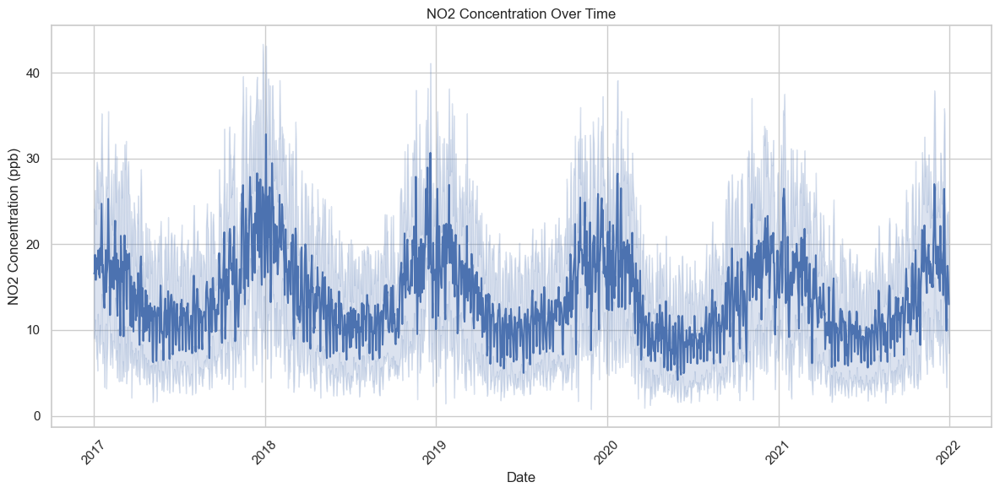

In [16]:
#reset the index to a column
avg_NO2_daily.reset_index(inplace=True)

# Plot the NO2 concentrations with 95% confidence intervals by date_local
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_daily, x='date_local', y='NO2_concentration', errorbar='sd')
plt.title('NO2 Concentration Over Time')
plt.xlabel('Date')
plt.ylabel('NO2 Concentration (ppb)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Average across all FIPS-Sites for each day in each metro area

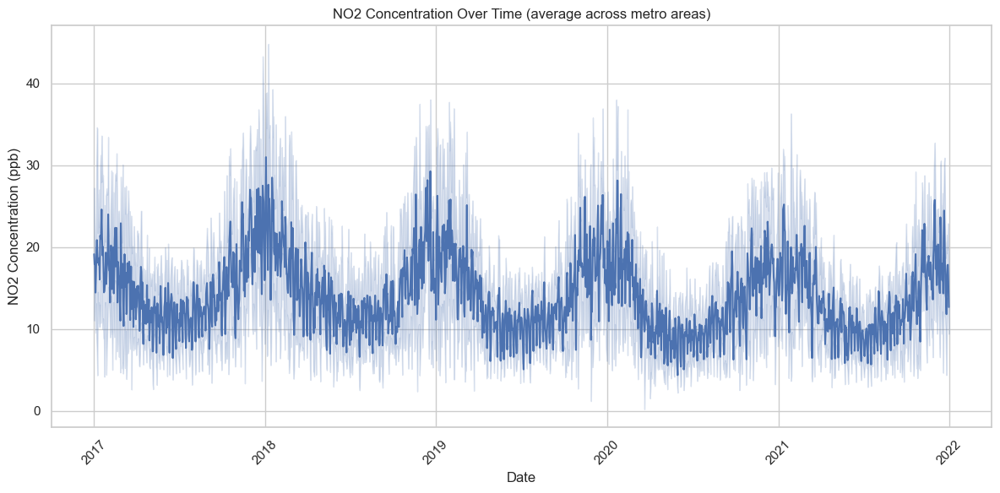

In [17]:
# Create a data table for the avearge NO2 concentration for each day by metro area
avg_NO2_metro = avg_NO2_daily.groupby(['metro_area', 'date_local', 'year', 'month_year'], observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_metro.columns = ['metro_area', 'date_local', 'year', 'month_year', 'NO2_concentration']
# Convert the date column to datetime format
avg_NO2_metro['date_local'] = pd.to_datetime(avg_NO2_metro['date_local'])
# Set the date column as the index
avg_NO2_metro.set_index('date_local', inplace=True)

# Plot the NO2 concentrations with 95% confidence intervals
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_metro, x='date_local', y='NO2_concentration', errorbar='sd')
plt.title('NO2 Concentration Over Time (average across metro areas)')
plt.xlabel('Date')
plt.ylabel('NO2 Concentration (ppb)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### Monthly NO2 Concentration by Metro Area ####

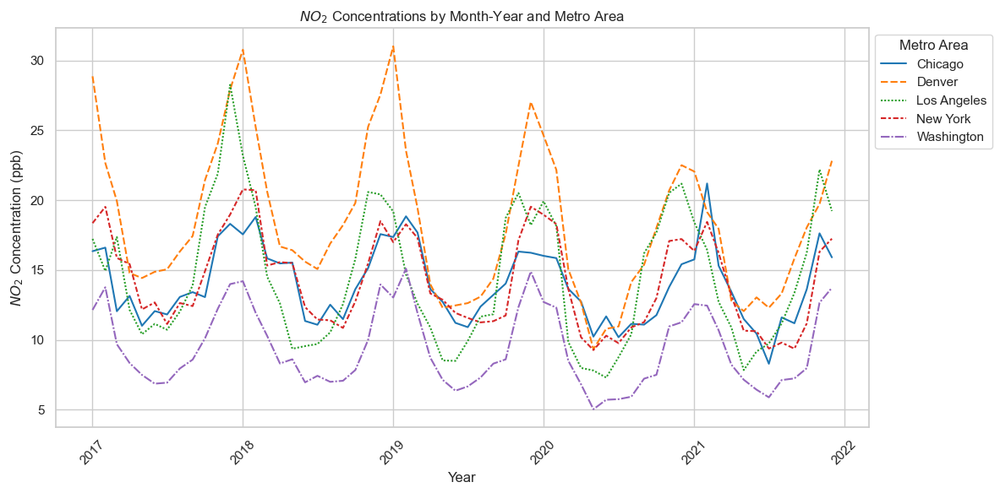

In [18]:
# Group by month and year and metro area and calculate the mean NO2 concentration
avg_NO2_month = avg_NO2_daily.groupby(['month_year', 'metro_area'], observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_month.columns = ['month_year', 'metro_area', 'NO2_concentration']
# Convert the month_year column to datetime format
avg_NO2_month['month_year'] = avg_NO2_month['month_year'].dt.to_timestamp()
# Set the month_year column as the index
avg_NO2_month.set_index('month_year', inplace=True)

# Create a pivot table for the average NO2 concentration by month and metro area
avg_NO2_pivot = avg_NO2_month.pivot_table(index='month_year', columns='metro_area', values='NO2_concentration', observed=True)
# Fill missing values with 0
avg_NO2_pivot.fillna(0, inplace=True)


# Plot the average NO2 concentration by month and metro area
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_pivot, palette='tab10')
plt.ylabel(r'$NO_2$ Concentration (ppb)')
plt.xlabel('Year')
plt.title(r'$NO_2$ Concentrations by Month-Year and Metro Area')
plt.xticks(rotation=45)
plt.legend(title='metro_area')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Metro Area')
plt.tight_layout()
plt.show()


#### Yearly Averages by Metro Area

In [19]:
# Group by year and metro area and calculate the mean NO2 concentration
avg_NO2_year = avg_NO2_daily.groupby(['year', 'metro_area'], observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_year.columns = ['year', 'metro_area', 'NO2_concentration']
# Set the year column as the index
avg_NO2_year.set_index('year', inplace=True)

# Create a pivot table for the average NO2 concentration by year and metro area
avg_NO2_year_pivot = avg_NO2_year.pivot_table(index='year', columns='metro_area', values='NO2_concentration', observed=True)
# Fill missing values with 0
avg_NO2_year_pivot.fillna(0, inplace=True)


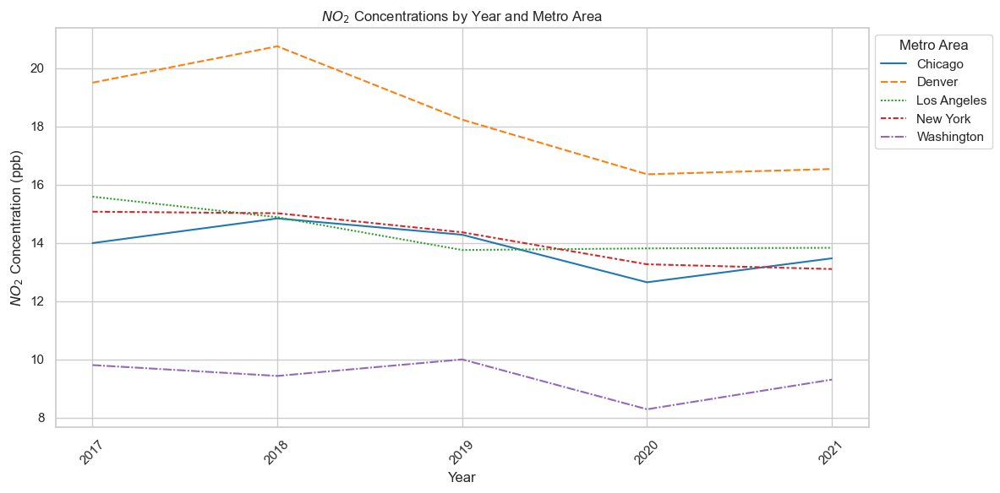

In [20]:
# Plot the average NO2 concentration by year and metro area
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_year_pivot, palette='tab10')
plt.ylabel(r'$NO_2$ Concentration (ppb)')
plt.xlabel('Year')
plt.title(r'$NO_2$ Concentrations by Year and Metro Area')
plt.xticks(rotation=45)
# remove the .5 from the x-axis ticks
plt.xticks(ticks=avg_NO2_year_pivot.index, labels=[str(int(x)) for x in avg_NO2_year_pivot.index])
plt.legend(title='metro area')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Metro Area')
plt.tight_layout()
plt.show()


#### Day of the Week Variability

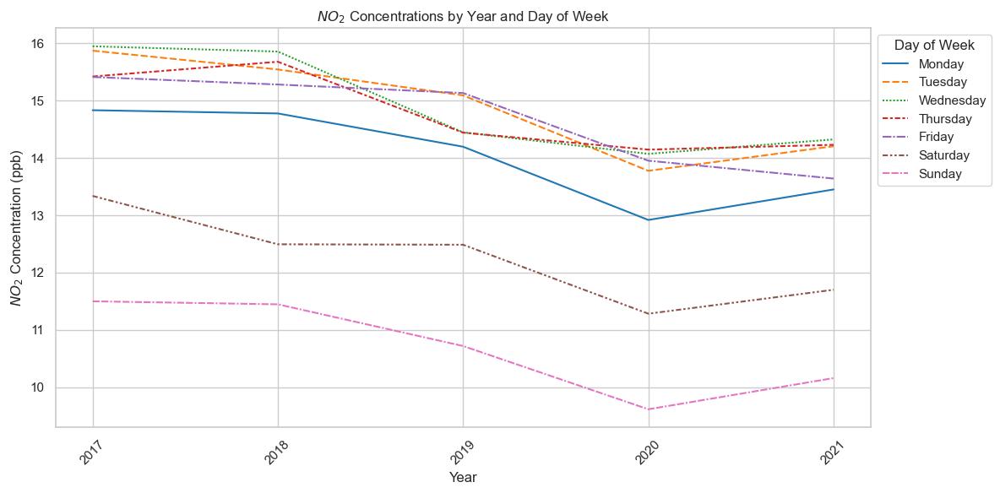

In [21]:
# Group by year and day of week and calculate the mean NO2 concentration
avg_NO2_dow = avg_NO2_daily.groupby(['year', 'day_of_week'], observed=True).agg({'NO2_concentration': 'mean'}).reset_index()
# Rename the columns for clarity
avg_NO2_dow.columns = ['year', 'day_of_week', 'NO2_concentration']
# Set the year column as the index
avg_NO2_dow.set_index('year', inplace=True)
# Create a pivot table for the average NO2 concentration by year and day of week
avg_NO2_dow_pivot = avg_NO2_dow.pivot_table(index='year', columns='day_of_week', values='NO2_concentration', observed=True)
# Fill missing values with 0
avg_NO2_dow_pivot.fillna(0, inplace=True)
# Reorder the columns to match the days of the week
dow_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
avg_NO2_dow_pivot = avg_NO2_dow_pivot[dow_order]

# Plot the average NO2 concentration by year and day of week
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_dow_pivot, palette='tab10')
plt.ylabel(r'$NO_2$ Concentration (ppb)')
plt.xlabel('Year')
plt.title(r'$NO_2$ Concentrations by Year and Day of Week')
plt.xticks(rotation=45)
# remove the .5 from the x-axis ticks
plt.xticks(ticks=avg_NO2_dow_pivot.index, labels=[str(int(x)) for x in avg_NO2_dow_pivot.index])
plt.legend(title='Day of Week')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), title='Day of Week')
plt.tight_layout()
plt.show()


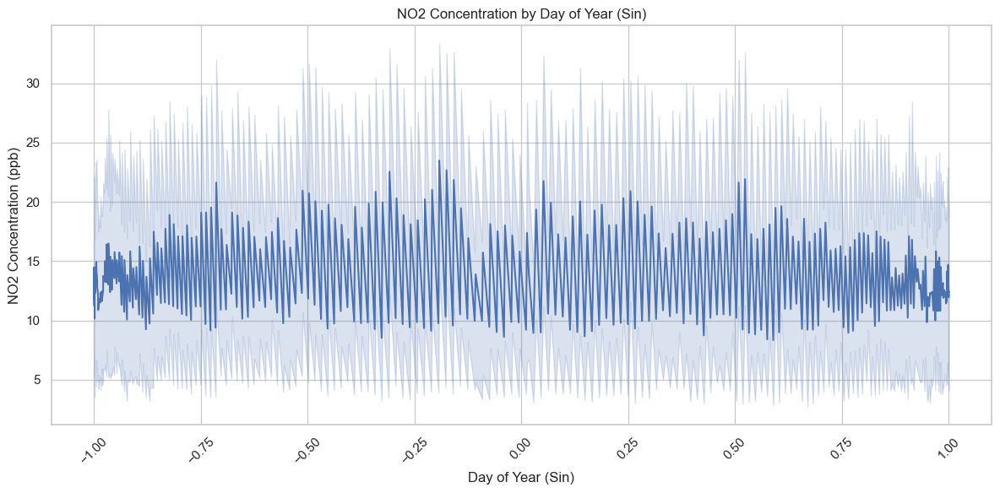

In [22]:
# Plot NO2 concentrations by day_of_year_sin
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_daily, x='day_of_year_sin', y='NO2_concentration', errorbar='sd')
plt.title('NO2 Concentration by Day of Year (Sin)')
plt.xlabel('Day of Year (Sin)')
plt.ylabel('NO2 Concentration (ppb)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


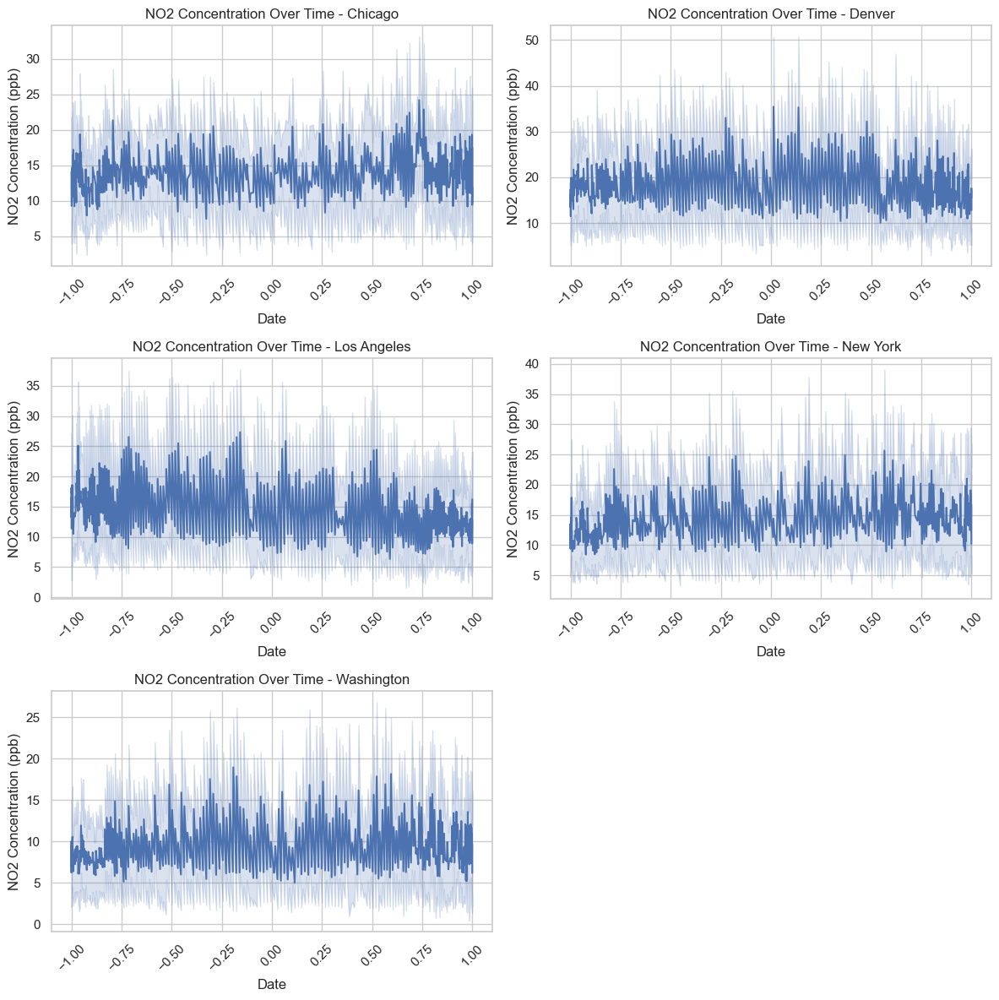

In [23]:
# Create a 3x2 grid of subplots for each metro area
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
# Flatten the axes array for easy indexing
axes = axes.flatten()
# Create a list of unique metro areas
metro_areas = avg_NO2_daily['metro_area'].unique()
# Sort the metro areas in alphabetical order
metro_areas = sorted(metro_areas)

# Loop through each metro area and create a line plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_daily[avg_NO2_daily['metro_area'] == metro_area]
    # Create a line plot for the current metro area
    sns.lineplot(metro_data, x='day_of_year_sin', y='NO2_concentration', ax=axes[i], errorbar='sd')
    # Set the title and labels for each subplot
    axes[i].set_title(f'NO2 Concentration Over Time - {metro_area}')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('NO2 Concentration (ppb)')
    axes[i].tick_params(axis='x', rotation=45)

# Drop any empty subplots if there are fewer metro areas than subplots
# Remove the empty subplot
axes[-1].axis('off')
fig.tight_layout()


### Data Distribution

In [24]:
"""
for metro_area in metro_areas:
    # Filter by metro area
    NO2_metro = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]

    # Create a histogram of the NO2 concentrations
    plt.figure(figsize=(12, 6))
    sns.histplot(NO2_metro['NO2_concentration'], bins=15, kde=True, stat='density', color='blue')
    plt.title(f'Histogram of NO2 Concentrations in {metro_area}')
    plt.xlabel('NO2 Concentration (ppb)')
    plt.ylabel('Frequency')
    plt.axvline(NO2_metro['NO2_concentration'].mean(), color='red', linestyle='--', label='Mean')
    plt.axvline(NO2_metro['NO2_concentration'].median(), color='green', linestyle='--', label='Median')
    plt.legend()
    plt.tight_layout()
    plt.show()"
"""


'\nfor metro_area in metro_areas:\n    # Filter by metro area\n    NO2_metro = avg_NO2_metro[avg_NO2_metro[\'metro_area\'] == metro_area]\n\n    # Create a histogram of the NO2 concentrations\n    plt.figure(figsize=(12, 6))\n    sns.histplot(NO2_metro[\'NO2_concentration\'], bins=15, kde=True, stat=\'density\', color=\'blue\')\n    plt.title(f\'Histogram of NO2 Concentrations in {metro_area}\')\n    plt.xlabel(\'NO2 Concentration (ppb)\')\n    plt.ylabel(\'Frequency\')\n    plt.axvline(NO2_metro[\'NO2_concentration\'].mean(), color=\'red\', linestyle=\'--\', label=\'Mean\')\n    plt.axvline(NO2_metro[\'NO2_concentration\'].median(), color=\'green\', linestyle=\'--\', label=\'Median\')\n    plt.legend()\n    plt.tight_layout()\n    plt.show()"\n'

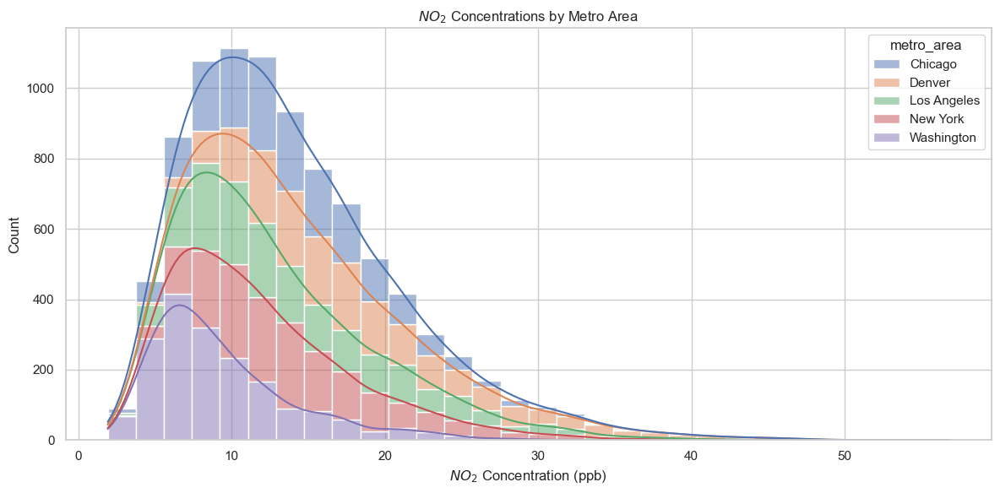

In [25]:
# Create Histograms of the NO2 Concentrations by Metro Area
plt.figure(figsize=(12, 6))
sns.histplot(data=avg_NO2_metro, x='NO2_concentration', hue='metro_area', multiple='stack', bins=30, kde=True, stat='count')
plt.ylabel('Count')
plt.xlabel(r'$NO_2$ Concentration (ppb)')
plt.title(r'$NO_2$ Concentrations by Metro Area')
plt.tight_layout()
plt.show()


#### Combined Histogram

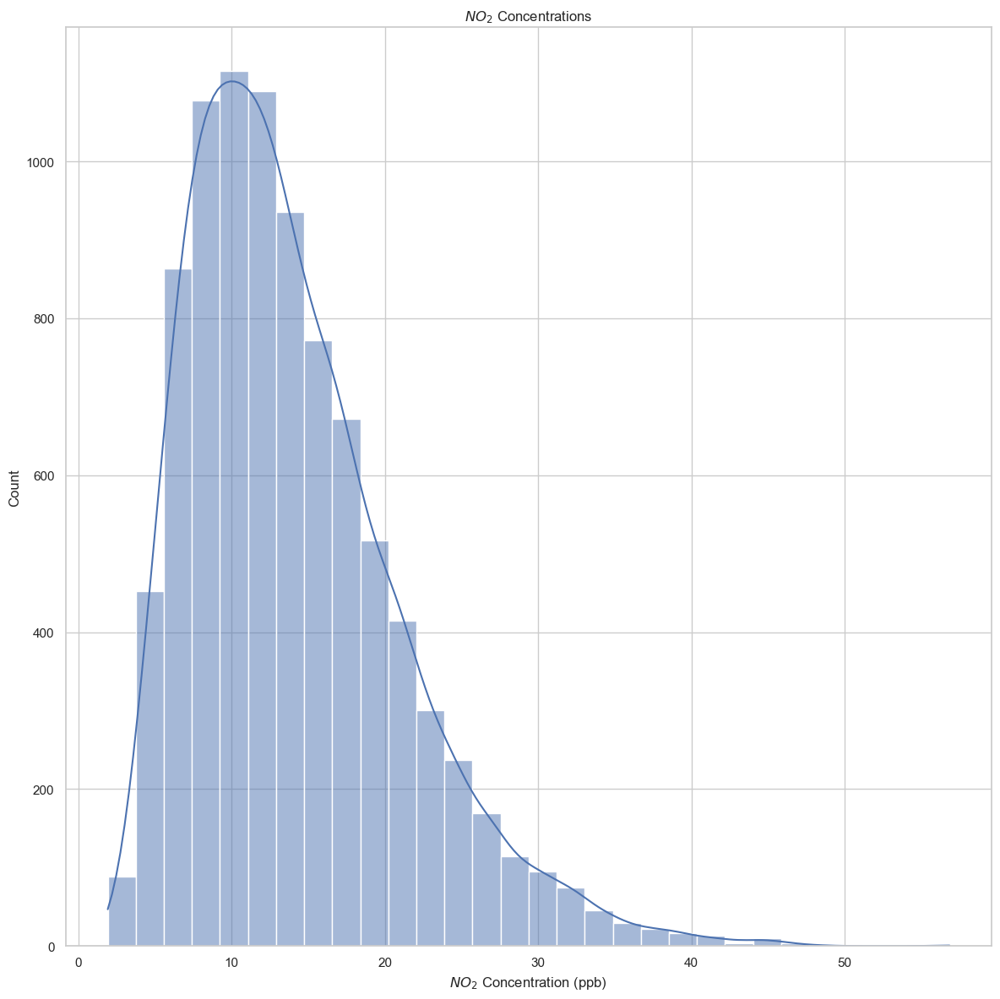

In [26]:
# Plot all the NO2 concentration 
plt.figure(figsize=(12, 12))
sns.histplot(data=avg_NO2_metro, x='NO2_concentration', bins=30, kde=True )
plt.ylabel('Count')
plt.xlabel(r'$NO_2$ Concentration (ppb)')
plt.title(r'$NO_2$ Concentrations')
plt.tight_layout()
plt.show()


#### Metro Area Separated Histogram

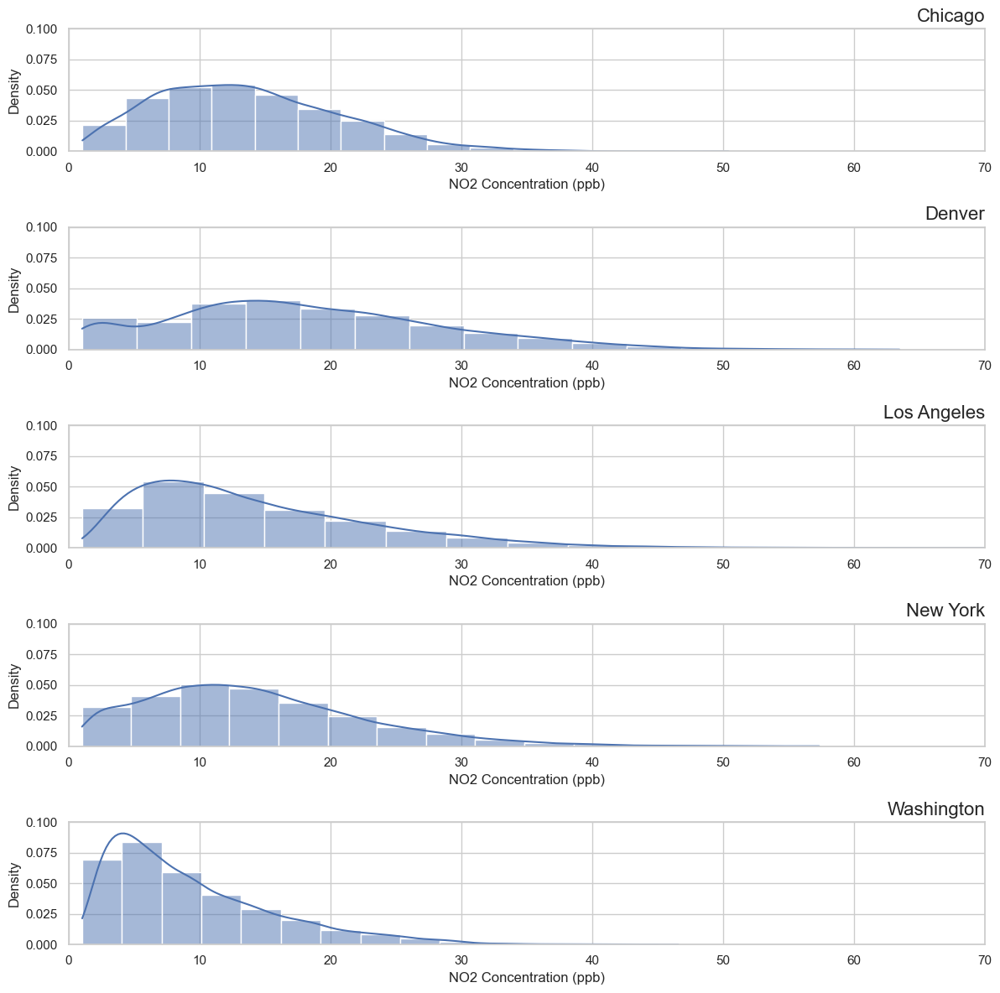

In [27]:
# Create a figure with subplots for each metro area
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 12))

# Loop through each metro area and create a histogram
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_daily[avg_NO2_daily['metro_area'] == metro_area]
    # Create a histogram for the current metro area
    sns.histplot(data=metro_data, x='NO2_concentration', bins=15, kde=True, ax=axes[i], stat='density')
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlim(0,70)
    axes[i].set_xlabel('NO2 Concentration (ppb)')
    axes[i].set_ylim(0,0.1)

fig.tight_layout()


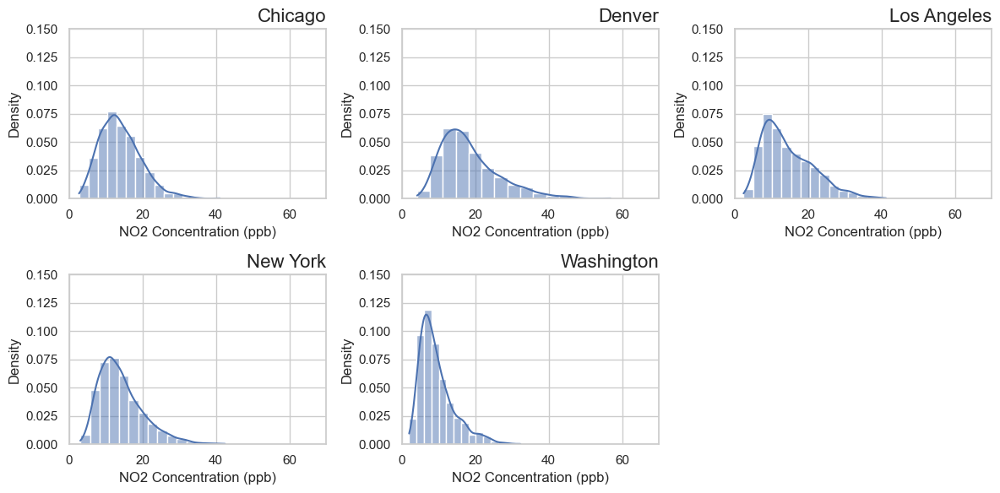

In [28]:
# Different Image Stacking Options
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 6))
# Flatten the axes array for easy indexing
axes = axes.flatten()
# Loop through each metro area and create a histogram
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Create a histogram for the current metro area
    sns.histplot(data=metro_data, x='NO2_concentration', bins=15, kde=True, ax=axes[i], stat='density')
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlim(0,70)
    axes[i].set_xlabel('NO2 Concentration (ppb)')
    axes[i].set_ylim(0,0.15)

# Remove the empty subplot
axes[-1].axis('off')
fig.tight_layout()


In [29]:
# Create Data table of mean and standard deviation of the NO2 log concentrations by metro area
avg_NO2_summary = avg_NO2_metro.groupby(['metro_area'], observed=True).agg({'NO2_concentration': ['mean', 'std']}).reset_index()
# Rename the columns for clarity
avg_NO2_summary.columns = ['metro_area', 'mean_NO2', 'std_NO2']
# Print the results
print("Mean and Standard Deviation of NO2 concentrations by metro area:")
print(avg_NO2_summary)


Mean and Standard Deviation of NO2 concentrations by metro area:
    metro_area  mean_NO2  std_NO2
0      Chicago     13.92     5.56
1       Denver     18.34     7.80
2  Los Angeles     14.41     6.86
3     New York     14.12     6.04
4   Washington      9.38     4.71


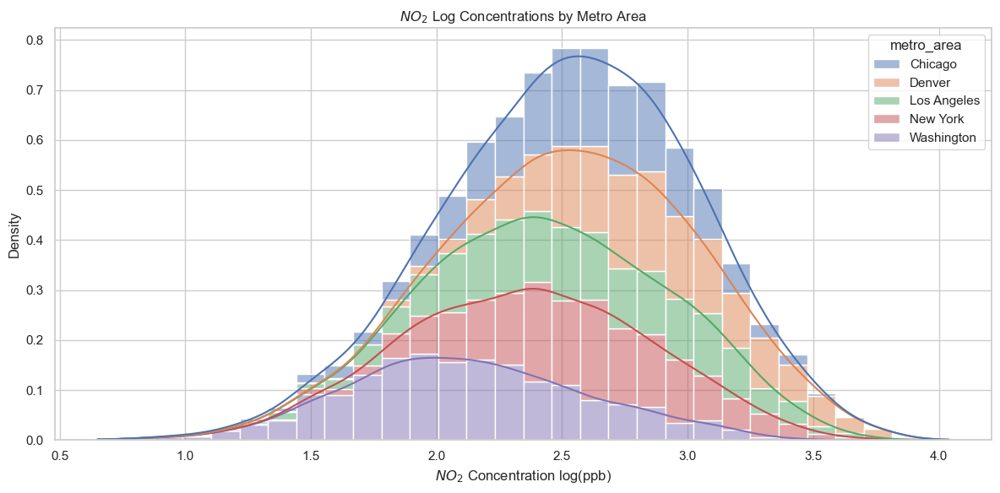

In [30]:
# Take the log of the NO2 concentrations to normalize the data
avg_NO2_metro['NO2_log'] = np.log(avg_NO2_metro['NO2_concentration'])

plt.figure(figsize=(12, 6))
sns.histplot(data=avg_NO2_metro, x='NO2_log', hue='metro_area', multiple='stack', bins=30, kde=True, stat='density')
plt.ylabel('Density')
plt.xlabel(r'$NO_2$ Concentration log(ppb)')
plt.title(r'$NO_2$ Log Concentrations by Metro Area')
plt.tight_layout()
plt.show()


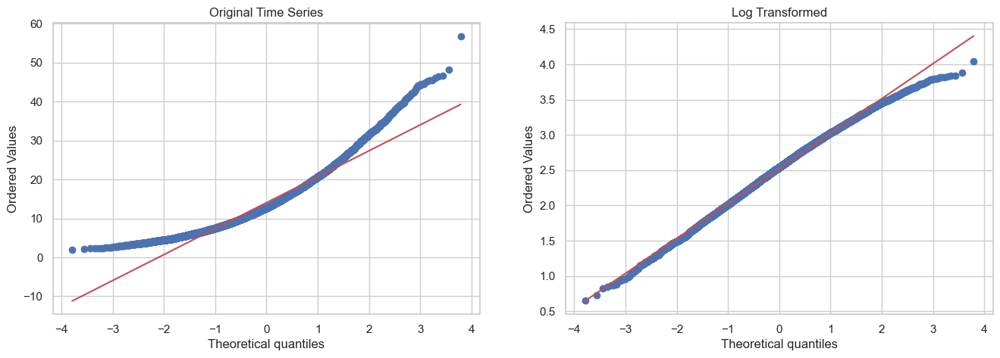

In [31]:
import scipy.stats as stats
# Create a Q-Q plot for the NO2 concentrations and the log of the NO2 concentrations
fig, ax = plt.subplots(1, 2, figsize=(16,5))
stats.probplot(avg_NO2_metro['NO2_concentration'], dist="norm", plot=ax[0])
ax[0].set_title('Original Time Series')
stats.probplot(avg_NO2_metro['NO2_log'], dist="norm", plot=ax[1])
ax[1].set_title('Log Transformed')
plt.show()


In [32]:
# Create Data table of mean and standard deviation of the NO2 log concentrations by metro area
avg_NO2_log_summary = avg_NO2_metro.groupby(['metro_area'], observed=True).agg({'NO2_log': ['mean', 'std']}).reset_index()
# Rename the columns for clarity
avg_NO2_log_summary.columns = ['metro_area', 'mean_NO2_log', 'std_NO2_log']
# Print the results
print("Mean and Standard Deviation of NO2 log concentrations by metro area:")
print(avg_NO2_log_summary)


Mean and Standard Deviation of NO2 log concentrations by metro area:
    metro_area  mean_NO2_log  std_NO2_log
0      Chicago          2.55         0.42
1       Denver          2.82         0.41
2  Los Angeles          2.55         0.48
3     New York          2.56         0.42
4   Washington          2.13         0.47


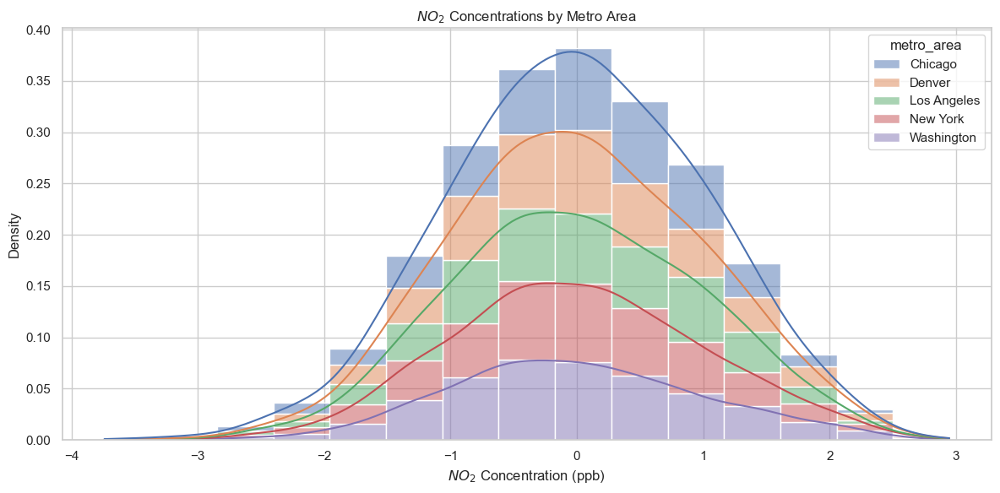

In [33]:
# Create a function to standardize the data
def standardize_data(data):
    return (data - data.mean()) / data.std()

# Standardize the NO2 log concentrations by metro area
avg_NO2_metro['NO2_log_std'] = avg_NO2_metro.groupby('metro_area')['NO2_log'].transform(standardize_data)

plt.figure(figsize=(12, 6))
sns.histplot(data=avg_NO2_metro, x='NO2_log_std', hue='metro_area', multiple='stack', bins=15, kde=True, stat='density')
plt.ylabel('Density')
plt.xlabel(r'$NO_2$ Concentration (ppb)')
plt.title(r'$NO_2$ Concentrations by Metro Area')
plt.tight_layout()
plt.show()


In [34]:
# Create a data table of the mean and standard deviation of the NO2 log concentrations by metro area
avg_NO2_std_summary = avg_NO2_metro.groupby(['metro_area'], observed=True).agg({'NO2_log_std': ['mean', 'std']}).reset_index()
# Rename the columns for clarity
avg_NO2_std_summary.columns = ['metro_area', 'mean_NO2_log_std', 'std_NO2_log_std']
# Print the results
print("Mean and Standard Deviation of NO2 log concentrations by metro area:")
print(avg_NO2_std_summary)


Mean and Standard Deviation of NO2 log concentrations by metro area:
    metro_area  mean_NO2_log_std  std_NO2_log_std
0      Chicago             -0.00             1.00
1       Denver             -0.00             1.00
2  Los Angeles             -0.00             1.00
3     New York              0.00             1.00
4   Washington             -0.00             1.00


In [35]:
from scipy.stats import shapiro, kstest, normaltest

from statsmodels.stats.diagnostic import kstest_normal, normal_ad
def is_normal(test, p_level=0.05):
    stat, pval = test
    return 'Normal' if pval > 0.05 else 'Not Normal'

print('NO2_Concentration: ' + is_normal(kstest(avg_NO2_metro['NO2_concentration'], cdf='norm')))
print('NO2_Concentration Log: ' + is_normal(kstest(avg_NO2_metro['NO2_log'], cdf='norm')))


NO2_Concentration: Not Normal
NO2_Concentration Log: Not Normal


In [36]:
# Test for normality using the Shapiro-Wilk test for each metro area
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Perform the Shapiro-Wilk test
    stat, pval = shapiro(metro_data['NO2_concentration'])
    print(f'Shapiro-Wilk test for {metro_area}: statistic={stat:.3f}, p-value={pval:.3f}')
    # Check if the p-value is greater than 0.05
    if pval > 0.05:
        print(f'{metro_area} is normally distributed')
    else:
        print(f'{metro_area} is not normally distributed')


Shapiro-Wilk test for Chicago: statistic=0.972, p-value=0.000
Chicago is not normally distributed
Shapiro-Wilk test for Denver: statistic=0.930, p-value=0.000
Denver is not normally distributed
Shapiro-Wilk test for Los Angeles: statistic=0.940, p-value=0.000
Los Angeles is not normally distributed
Shapiro-Wilk test for New York: statistic=0.933, p-value=0.000
New York is not normally distributed
Shapiro-Wilk test for Washington: statistic=0.896, p-value=0.000
Washington is not normally distributed


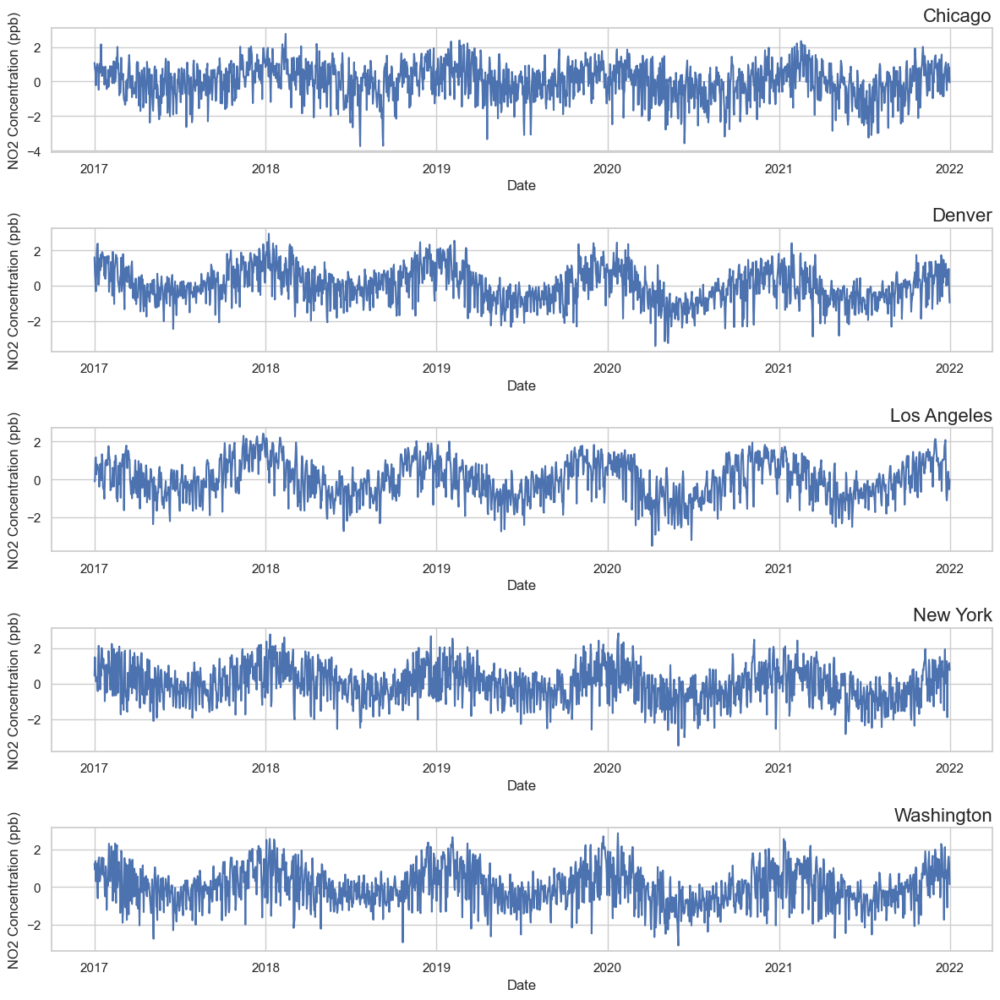

In [37]:
# Plot the NO2 concentrations as time series for each metro area in separate subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 12))
# Loop through each metro area and create a time series plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Create a time series plot for the current metro area
    sns.lineplot(data=metro_data, x='date_local', y='NO2_log_std', ax=axes[i])
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('NO2 Concentration (ppb)')

plt.tight_layout()


In [38]:
# Test for stationarity using the Augmented Dickey-Fuller test
def adf_test(series):
    result = adfuller(series)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))
    if result[1] <= 0.05:
        print("Reject the null hypothesis - the series is stationary")
    else:
        print("Fail to reject the null hypothesis - the series is non-stationary")
    return result[1]

# Test for stationarity using the Augmented Dickey-Fuller test for each metro area
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Perform the Augmented Dickey-Fuller test
    print(f'Augmented Dickey-Fuller test for {metro_area}:')
    adf_test(metro_data['NO2_log_std'])
    print('\n')


Augmented Dickey-Fuller test for Chicago:
ADF Statistic: -4.684744
p-value: 0.000090
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis - the series is stationary


Augmented Dickey-Fuller test for Denver:
ADF Statistic: -2.819760
p-value: 0.055506
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Fail to reject the null hypothesis - the series is non-stationary


Augmented Dickey-Fuller test for Los Angeles:
ADF Statistic: -3.152484
p-value: 0.022905
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis - the series is stationary


Augmented Dickey-Fuller test for New York:
ADF Statistic: -3.663280
p-value: 0.004660
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis - the series is stationary


Augmented Dickey-Fuller test for Washington:
ADF Statistic: -3.764370
p-value: 0.003294
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject the null hypothesis - the series is stationary




### Box-Cox Transforms


Lambda is: 0.15171


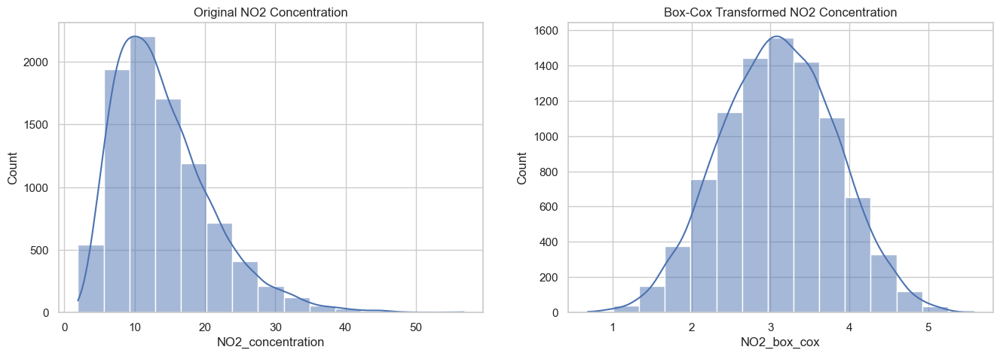

In [39]:
import scipy.stats as stats
from scipy.stats import boxcox

avg_NO2_metro['NO2_box_cox'], lmbda = boxcox(avg_NO2_metro['NO2_concentration'])
print('\nLambda is:', round(lmbda,5))

fig, ax = plt.subplots(1, 2, figsize=(16,5))
sns.histplot(avg_NO2_metro['NO2_concentration'], bins=15, kde=True, ax=ax[0])
ax[0].set_title('Original NO2 Concentration')
sns.histplot(avg_NO2_metro['NO2_box_cox'], bins=15, kde=True, ax=ax[1])
ax[1].set_title('Box-Cox Transformed NO2 Concentration')
plt.show()


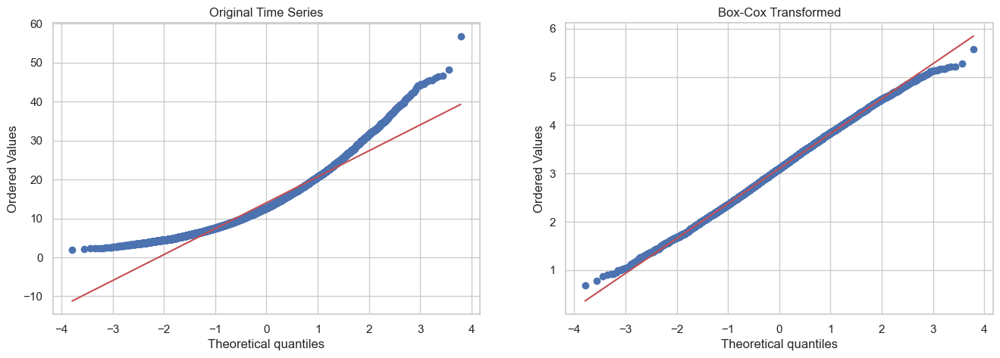

In [40]:
# Plot the Q-Q plots for the original and transformed data
fig, ax = plt.subplots(1, 2, figsize=(16,5))
stats.probplot(avg_NO2_metro['NO2_concentration'], dist="norm", plot=ax[0])
ax[0].set_title('Original Time Series')
stats.probplot(avg_NO2_metro['NO2_box_cox'], dist="norm", plot=ax[1])
ax[1].set_title('Box-Cox Transformed')
plt.show()


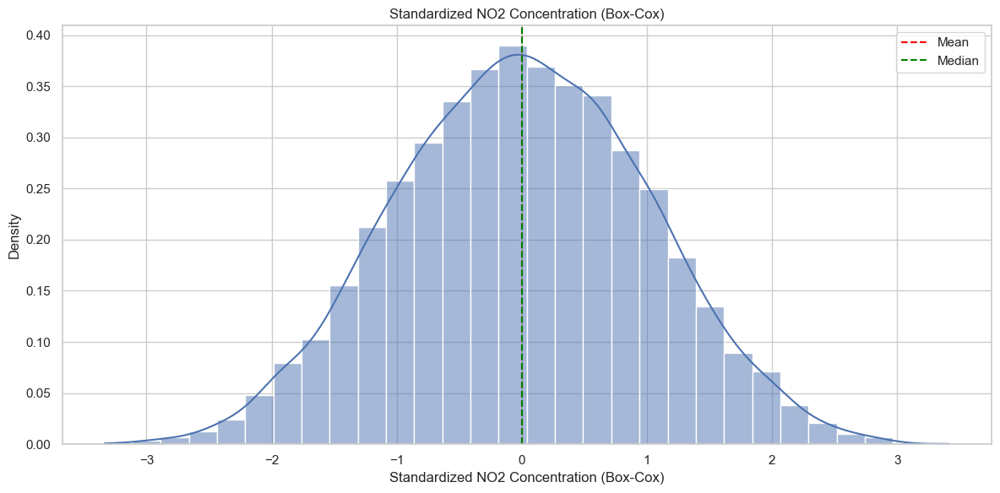

In [41]:
# Standardize the NO2 Box-Cox transformed data
avg_NO2_metro['NO2_box_cox_std'] = standardize_data(avg_NO2_metro['NO2_box_cox'])

# Plot the histogram of the standardized data
plt.figure(figsize=(12, 6))
sns.histplot(avg_NO2_metro['NO2_box_cox_std'], bins=30, kde=True, stat='density')
plt.ylabel('Density')
plt.xlabel('Standardized NO2 Concentration (Box-Cox)')
plt.title('Standardized NO2 Concentration (Box-Cox)')
plt.axvline(avg_NO2_metro['NO2_box_cox_std'].mean(), color='red', linestyle='--', label='Mean')
plt.axvline(avg_NO2_metro['NO2_box_cox_std'].median(), color='green', linestyle='--', label='Median')   
plt.legend()
plt.tight_layout()


Lambda for Chicago: 0.37614081762185864
Lambda for Denver: -0.016969689083335706
Lambda for Los Angeles: 0.10840294873289176
Lambda for New York: 0.010902401516827106
Lambda for Washington: -0.1085580324040887


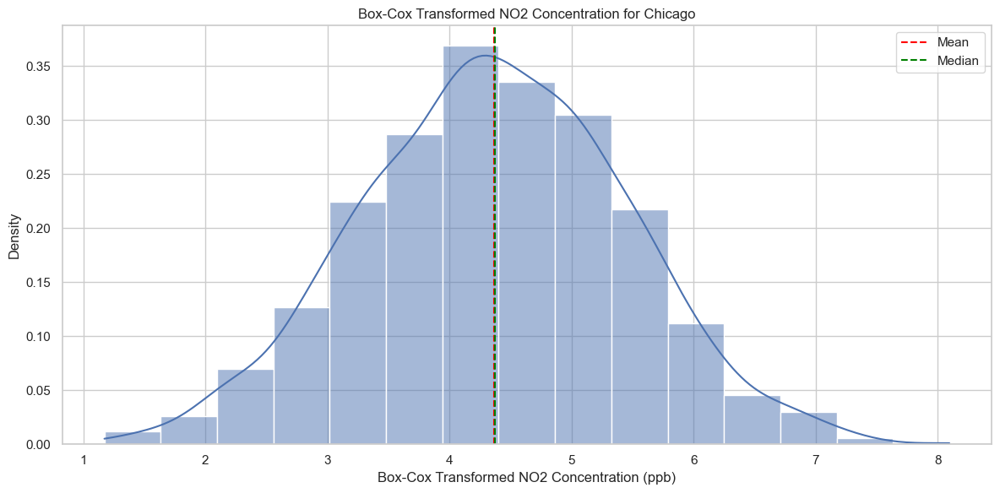

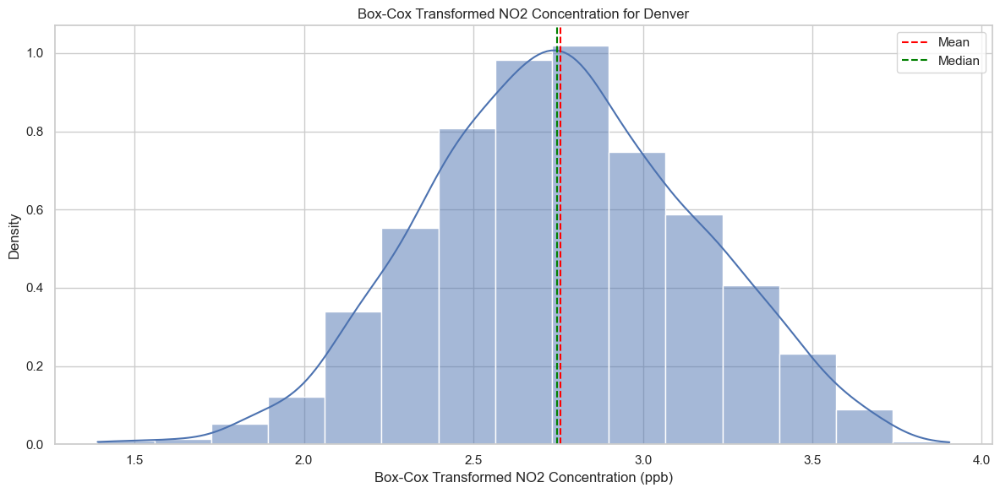

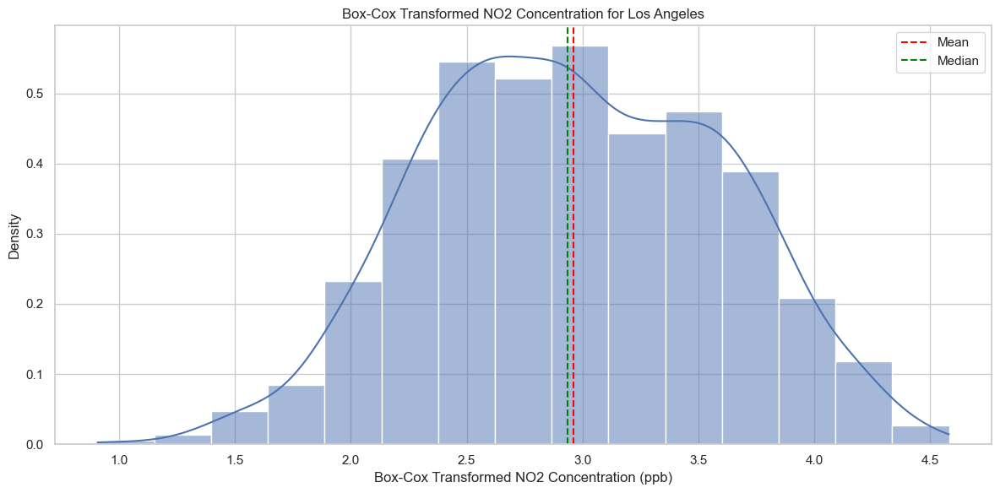

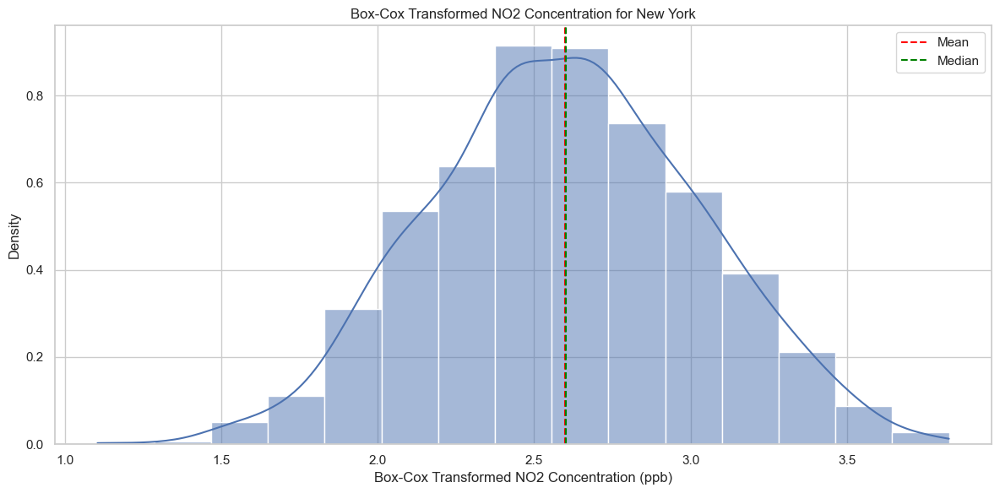

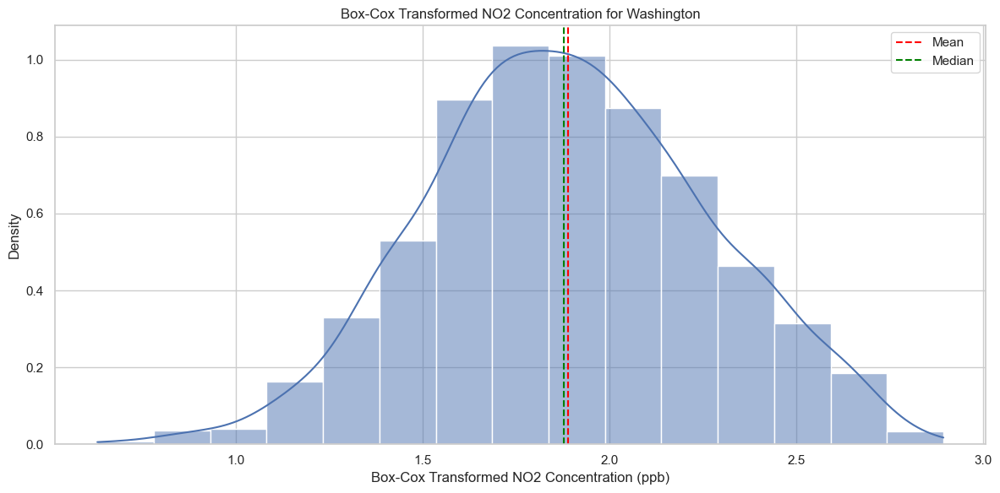

In [42]:
# Perform the Box-Cox transformation on the NO2 concentrations by metro area
avg_NO2_metro['NO2_box_cox'] = np.nan
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Perform the Box-Cox transformation
    avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox'], lmbda = boxcox(metro_data['NO2_concentration'])
    print(f'Lambda for {metro_area}: {lmbda}')
    # Plot the histogram of the Box-Cox transformed data
    plt.figure(figsize=(12, 6))
    sns.histplot(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox'], bins=15, kde=True, stat='density')
    plt.ylabel('Density')
    plt.xlabel('Box-Cox Transformed NO2 Concentration (ppb)')
    plt.title(f'Box-Cox Transformed NO2 Concentration for {metro_area}')
    plt.axvline(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox'].mean(), color='red', linestyle='--', label='Mean')
    plt.axvline(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox'].median(), color='green', linestyle='--', label='Median')
    plt.legend()
    plt.tight_layout()


In [43]:
# Test for normality using the Shapiro-Wilk test for each metro area
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Perform the Shapiro-Wilk test
    stat, pval = shapiro(metro_data['NO2_box_cox'])
    print(f'Shapiro-Wilk test for {metro_area}: statistic={stat:.3f}, p-value={pval:.3f}')
    if pval > 0.05:
        print(f'{metro_area} is normally distributed')
    else:
        print(f'{metro_area} is not normally distributed')


Shapiro-Wilk test for Chicago: statistic=0.999, p-value=0.642
Chicago is normally distributed
Shapiro-Wilk test for Denver: statistic=0.998, p-value=0.009
Denver is not normally distributed
Shapiro-Wilk test for Los Angeles: statistic=0.993, p-value=0.000
Los Angeles is not normally distributed
Shapiro-Wilk test for New York: statistic=0.999, p-value=0.107
New York is normally distributed
Shapiro-Wilk test for Washington: statistic=0.997, p-value=0.002
Washington is not normally distributed


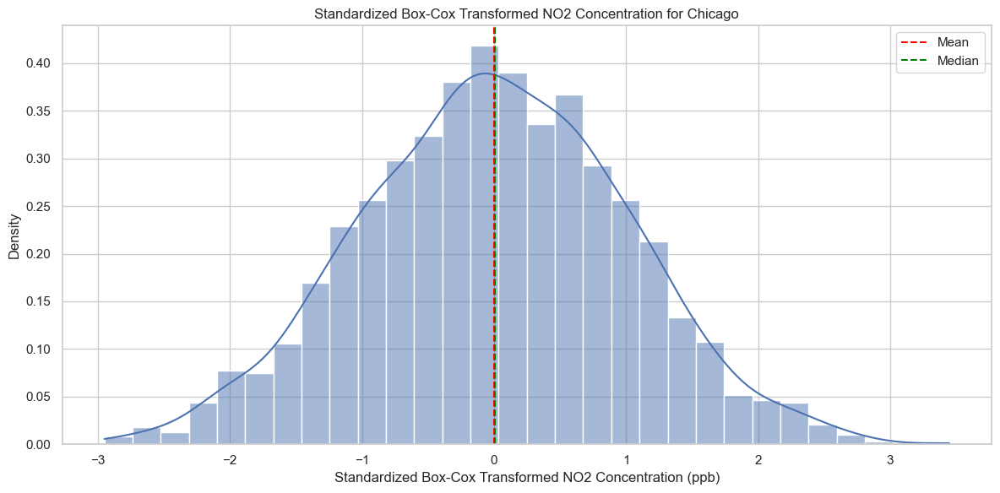

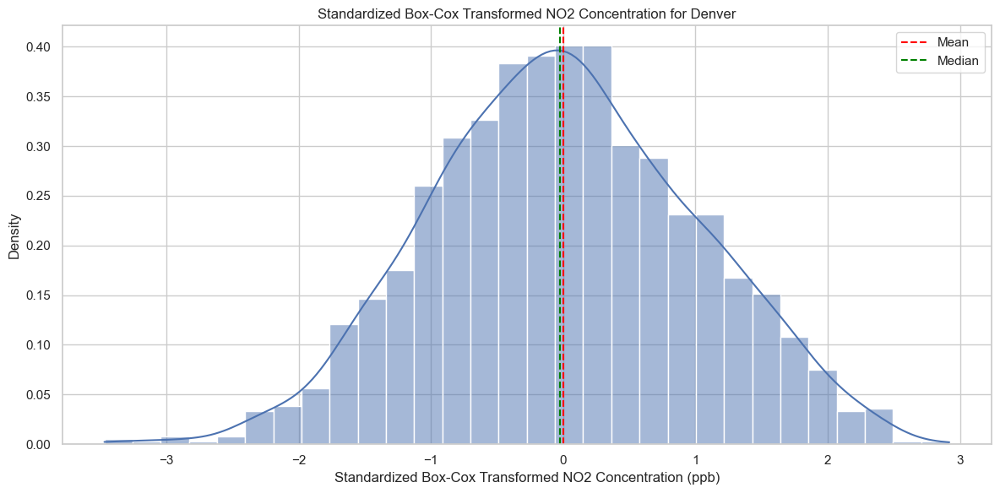

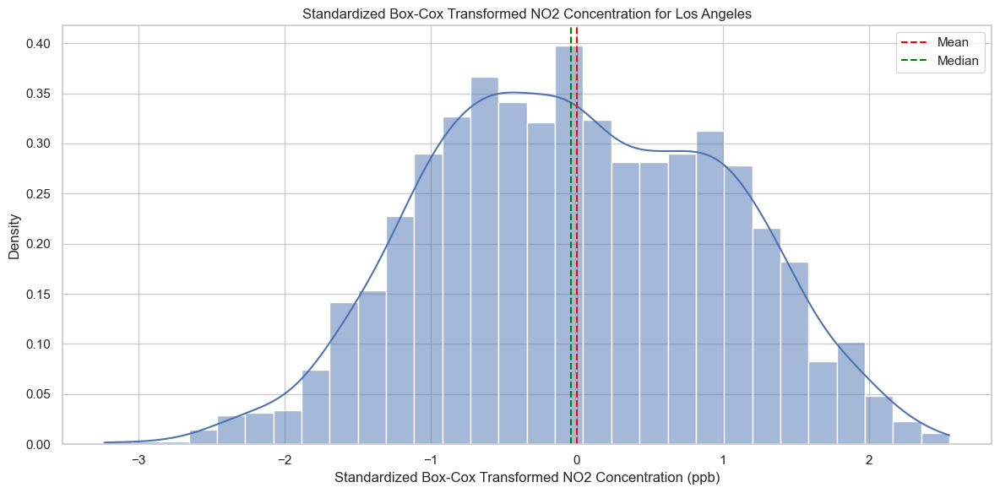

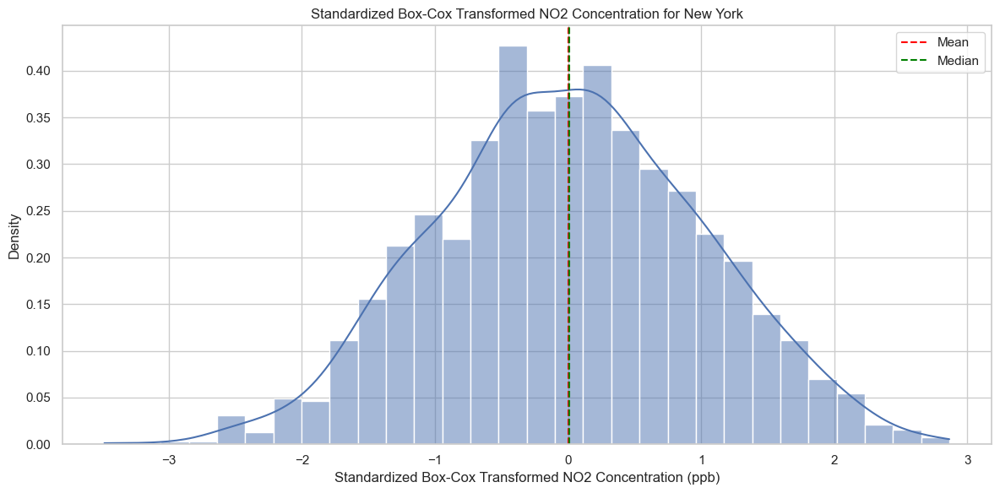

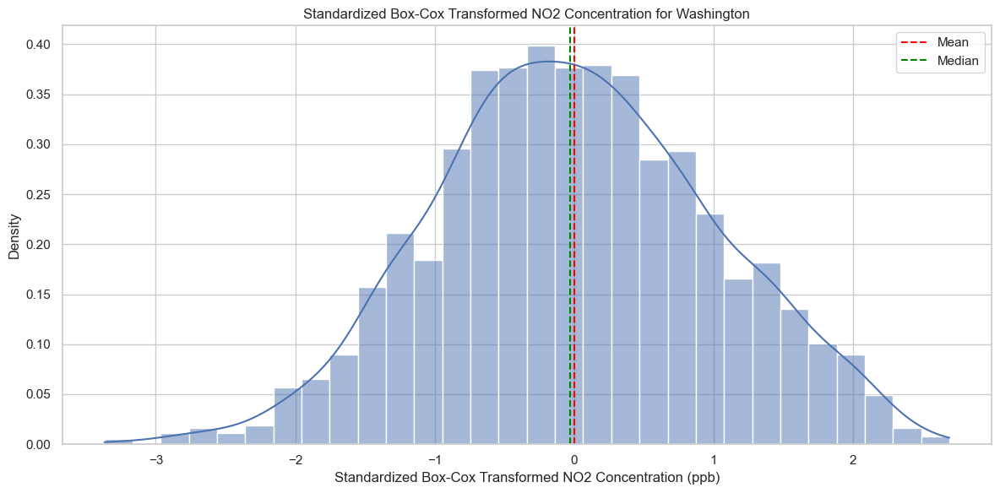

In [44]:
# Standardize the Box-Cox transformed data for each metro area
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Standardize the Box-Cox transformed data
    avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox_std'] = standardize_data(metro_data['NO2_box_cox'])
    # Plot the histogram of the standardized data
    plt.figure(figsize=(12, 6))
    sns.histplot(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox_std'], bins=30, kde=True, stat='density')
    plt.ylabel('Density')
    plt.xlabel('Standardized Box-Cox Transformed NO2 Concentration (ppb)')
    plt.title(f'Standardized Box-Cox Transformed NO2 Concentration for {metro_area}')
    plt.axvline(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox_std'].mean(), color='red', linestyle='--', label='Mean')
    plt.axvline(avg_NO2_metro.loc[avg_NO2_metro['metro_area'] == metro_area, 'NO2_box_cox_std'].median(), color='green', linestyle='--', label='Median')
    plt.legend()
    plt.tight_layout()
    plt.show()


In [45]:
# Perform the Shapiro-Wilk test for normality on the standardized data
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Perform the Shapiro-Wilk test
    stat, pval = shapiro(metro_data['NO2_box_cox_std'])
    print(f'Shapiro-Wilk test for {metro_area}: statistic={stat:.3f}, p-value={pval:.3f}')
    if pval > 0.05:
        print(f'{metro_area} is normally distributed')
    else:
        print(f'{metro_area} is not normally distributed')


Shapiro-Wilk test for Chicago: statistic=0.999, p-value=0.642
Chicago is normally distributed
Shapiro-Wilk test for Denver: statistic=0.998, p-value=0.009
Denver is not normally distributed
Shapiro-Wilk test for Los Angeles: statistic=0.993, p-value=0.000
Los Angeles is not normally distributed
Shapiro-Wilk test for New York: statistic=0.999, p-value=0.107
New York is normally distributed
Shapiro-Wilk test for Washington: statistic=0.997, p-value=0.002
Washington is not normally distributed


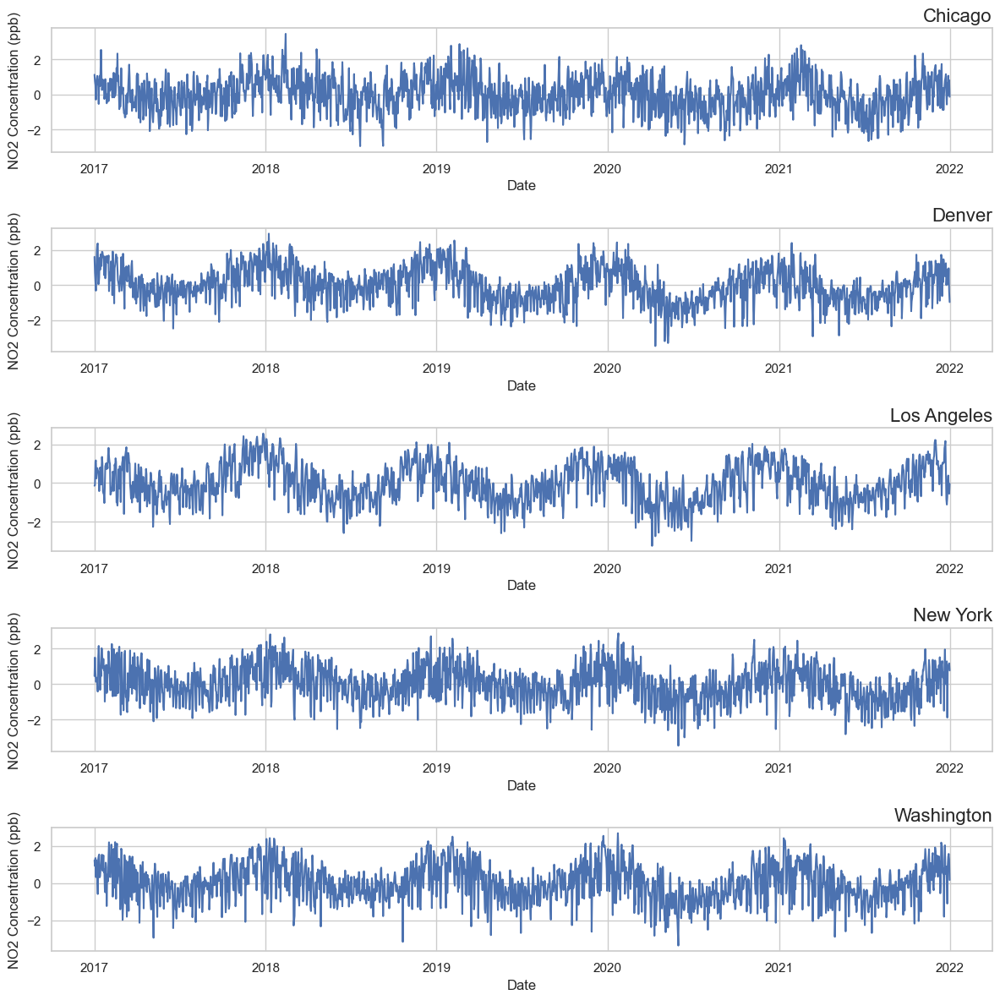

In [46]:
# Plot the NO2 concentrations as time series for each metro area in separate subplots
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(12, 12))
# Loop through each metro area and create a time series plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Create a time series plot for the current metro area
    sns.lineplot(data=metro_data, x='date_local', y='NO2_box_cox_std', ax=axes[i])
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel('NO2 Concentration (ppb)')

plt.tight_layout()


### Metro Area Analysis

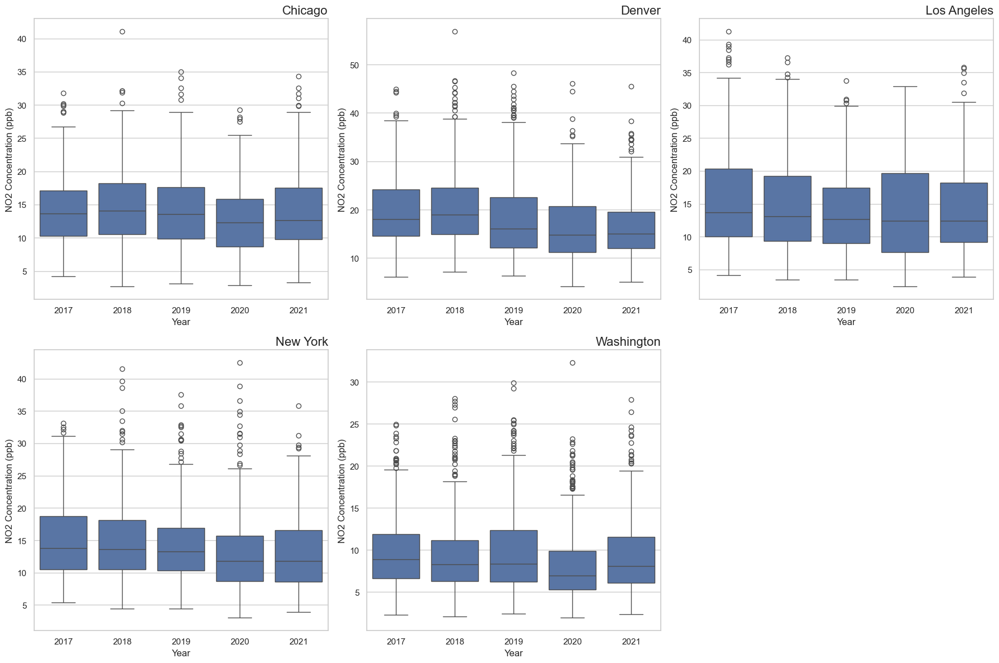

In [47]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
# Flatten the axes array for easier indexing
axes = axes.flatten()
# Loop through each metro area and create a box-plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Create a box-plot for the current metro area
    sns.boxplot(data=metro_data, x='year', y='NO2_concentration' , ax=axes[i])
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('NO2 Concentration (ppb)')

# Remove the last empty subplot
axes[-1].axis('off')
fig.tight_layout()


# Year Factor Analysis

### Examine the aggregated data by year

               df     sum_sq  mean_sq     F  PR(>F)  eta_sq  omega_sq
C(year)      4.00   6,244.74 1,561.18 33.27    0.00    0.01      0.01
Residual 9,125.00 428,137.56    46.92   NaN     NaN     NaN       NaN
Intercept         14.90
C(year)[T.2018]    0.01
C(year)[T.2019]   -0.72
C(year)[T.2020]   -2.03
C(year)[T.2021]   -1.58
dtype: float64
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
  2017   2018   0.0089    1.0 -0.6098  0.6275  False
  2017   2019  -0.7222 0.0126 -1.3409 -0.1036   True
  2017   2020  -2.0349    0.0 -2.6531 -1.4166   True
  2017   2021  -1.5842    0.0 -2.2028 -0.9655   True
  2018   2019  -0.7311 0.0111 -1.3498 -0.1124   True
  2018   2020  -2.0437    0.0  -2.662 -1.4255   True
  2018   2021   -1.593    0.0 -2.2117 -0.9744   True
  2019   2020  -1.3127    0.0 -1.9309 -0.6944   True
  2019   2021  -0.8619 0.0014 -1.4806 -0.2433   True
  2020   2021   0.4

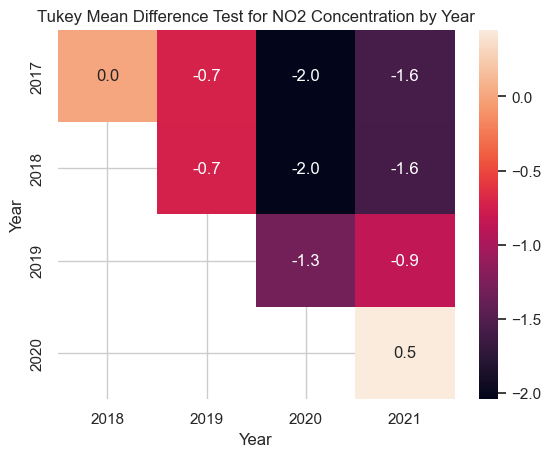

In [48]:
# ANOVA Test and Results
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp

ols_model = ols('NO2_concentration ~ C(year)', data=avg_NO2_metro).fit()
aov_table = sm.stats.anova_lm(ols_model)
# The function below was created specifically for the one-way ANOVA table results returned for Type II sum of squares
# https://www.pythonfordatascience.org/anova-python/
def anova_table(aov):
    aov['mean_sq'] = aov[:]['sum_sq']/aov[:]['df']
    aov['eta_sq'] = aov[:-1]['sum_sq']/sum(aov['sum_sq'])
    aov['omega_sq'] = (aov[:-1]['sum_sq']-(aov[:-1]['df']*aov['mean_sq'][-1]))/(sum(aov['sum_sq'])+aov['mean_sq'][-1])

    cols = ['sum_sq', 'df', 'mean_sq', 'F', 'PR(>F)', 'eta_sq', 'omega_sq']
    aov = aov[cols]
    return aov

anova_table(aov_table)
print(aov_table)

#Examination of coefficients
coefficients = ols_model.params
print(coefficients)


from statsmodels.stats.multicomp import pairwise_tukeyhsd
tukey = pairwise_tukeyhsd(endog=avg_NO2_metro['NO2_concentration'],
                          groups=avg_NO2_metro['year'],
                          alpha=0.05)
print(tukey)
tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
tukey_simple= tukey_df[['group1', 'group2','meandiff']]
df_pivoted = tukey_simple.pivot_table(index='group1', columns='group2',values = 'meandiff', aggfunc='mean')

# Create the heatmap
sns.heatmap(data=df_pivoted, annot=True, fmt='.1f')

# Set the title and labels
plt.title('Tukey Mean Difference Test for NO2 Concentration by Year')
plt.xlabel('Year')
plt.ylabel('Year')

# Show the plot
plt.show()


### Examine by two groups

In [49]:
# Group the NO2 data into two groups: pre-COVID and post-COVID
covid_date = '2020-03-15'
# Reset the index to a column
avg_NO2_metro.reset_index(inplace=True)
avg_NO2_metro['COVID'] = np.where(avg_NO2_metro['date_local'] < covid_date, 'Pre-COVID', 'Post-COVID')

# Remove all rows with date_local >= covid_date + 1 year
avg_NO2_metro = avg_NO2_metro[avg_NO2_metro['date_local'] < '2021-03-15']
# Remove all rows with date_local < '2017-03-15'
avg_NO2_metro = avg_NO2_metro[avg_NO2_metro['date_local'] >= '2017-03-15']

# Remove all rows with year = 2021
#avg_NO2_metro = avg_NO2_metro[avg_NO2_metro['year'] != 2021]
# Remove all rows with year = 2022
#avg_NO2_metro = avg_NO2_metro[avg_NO2_metro['year'] != 2022]


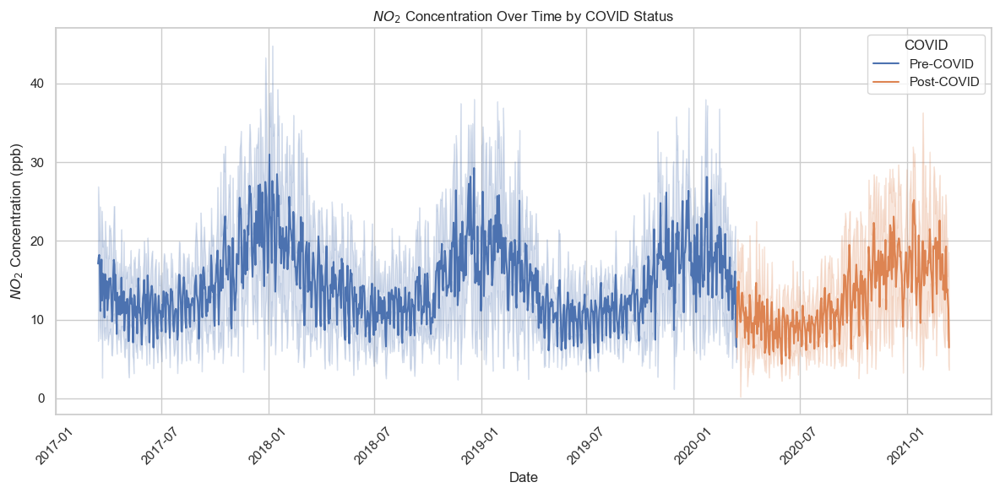

In [50]:
# Plot the time series of the NO2 concentrations by metro area and COVID status
plt.figure(figsize=(12, 6))
sns.lineplot(data=avg_NO2_metro, x='date_local', y='NO2_concentration', hue='COVID', errorbar='sd')
plt.title(r'$NO_2$ Concentration Over Time by COVID Status')
plt.xlabel('Date')
plt.ylabel(r'$NO_2$ Concentration (ppb)')
plt.xticks(rotation=45)
plt.tight_layout()


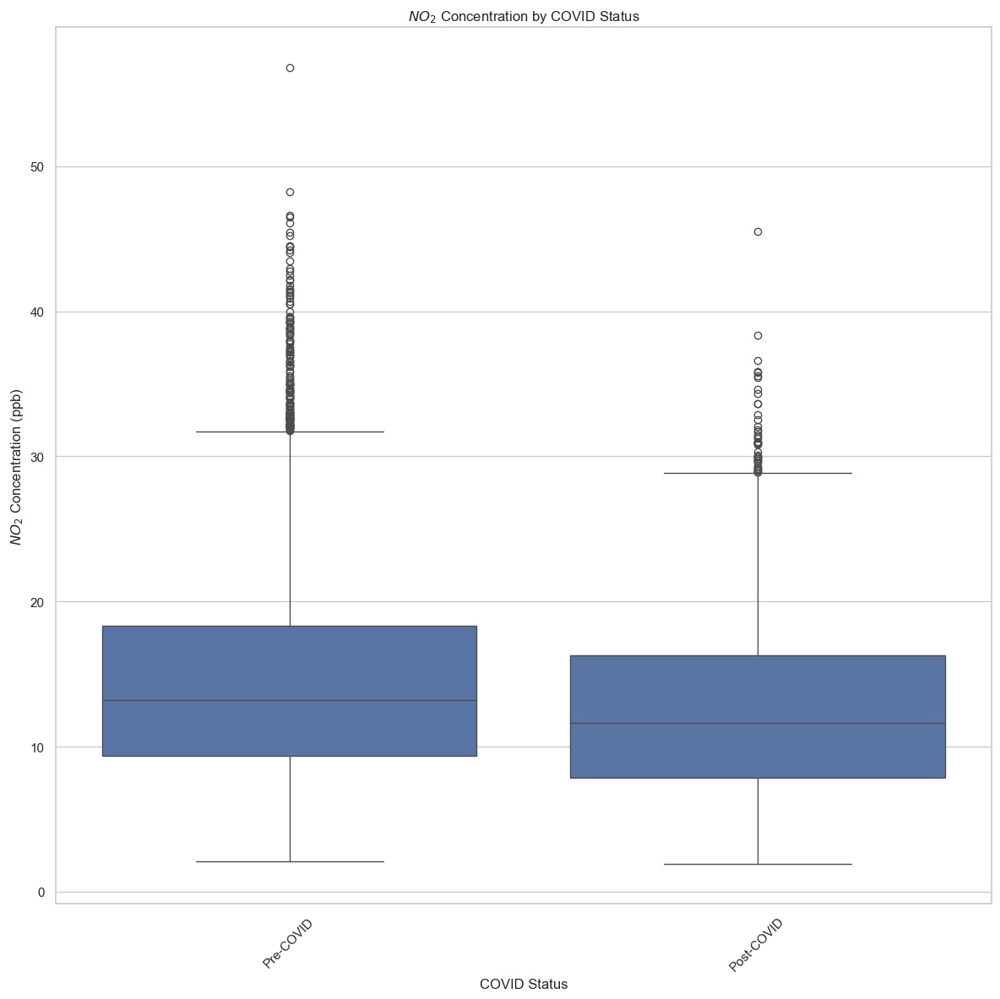

In [51]:
# Create a boxplot of the NO2 concentrations by COVID status
plt.figure(figsize=(12, 12))
sns.boxplot(data=avg_NO2_metro, x='COVID', y='NO2_concentration')
plt.ylabel(r'$NO_2$ Concentration (ppb)')
plt.xlabel('COVID Status')
plt.title(r'$NO_2$ Concentration by COVID Status')
plt.xticks(rotation=45)
plt.tight_layout()


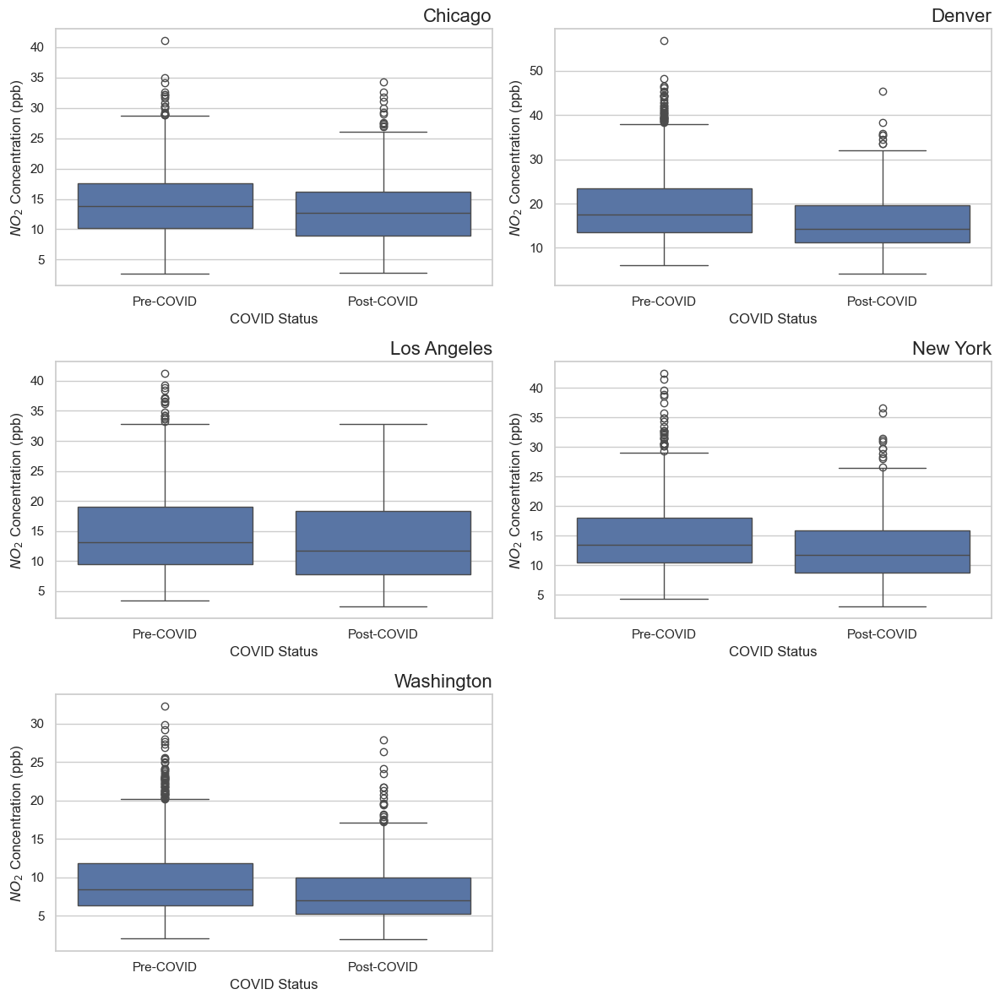

In [52]:
# Create the box-plots for the NO2 concentrations by metro area and COVID status
# Using a 3 x 2 grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
# Flatten the axes array for easier indexing
axes = axes.flatten()
# Loop through each metro area and create a box-plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Create a box-plot for the current metro area
    sns.boxplot(data=metro_data, x='COVID', y='NO2_concentration', ax=axes[i])
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlabel('COVID Status')
    axes[i].set_ylabel(r'$NO_2$ Concentration (ppb)')
    #axes[i].set_ylim(-3, 3)
# Remove the last empty subplot
axes[-1].axis('off')
fig.tight_layout()


In [53]:
# Perform a t-test to compare the means of the two groups
from scipy.stats import ttest_ind
from scipy.stats import ttest_ind, levene

# Filter the data into two groups: pre-COVID and post-COVID
pre_COVID = avg_NO2_metro[avg_NO2_metro['COVID'] == 'Pre-COVID']['NO2_log_std']
post_COVID = avg_NO2_metro[avg_NO2_metro['COVID'] == 'Post-COVID']['NO2_log_std']

# Perform Levene's test for equal variances
stat, pval = levene(pre_COVID, post_COVID)
# Levene's Test
from scipy.stats import levene
if levene(pre_COVID, post_COVID)[1] < 0.05:
    print('Reject the null hypothesis of equal variance between groups.')
    print(f'P-value is {levene(pre_COVID, post_COVID)[1]}.')
else:
    print('Fail to reject the null hypothesis of equal variance between groups.')
    print(f'P-value is {levene(pre_COVID, post_COVID)[1]}.')

# Perform the t-test
t_stat, pval = ttest_ind(pre_COVID, post_COVID, equal_var=False)
if pval < 0.05:
    print('Reject the null hypothesis of equal means between groups.')
    print(f'P-value is {pval}.')
else:
    print('Fail to reject the null hypothesis of equal means between groups.')
    print(f'P-value is {pval}.')


Reject the null hypothesis of equal variance between groups.
P-value is 8.03791355249985e-08.
Reject the null hypothesis of equal means between groups.
P-value is 1.021448866735746e-32.


In [54]:
# Calculate the mean difference between the two groups
pre_COVID = avg_NO2_metro[avg_NO2_metro['COVID'] == 'Pre-COVID']['NO2_concentration']
post_COVID = avg_NO2_metro[avg_NO2_metro['COVID'] == 'Post-COVID']['NO2_concentration']
mean_diff = np.mean(pre_COVID) - np.mean(post_COVID)
print('Mean difference:', mean_diff)

# Calculate the confidence interval for the mean difference
import pingouin as pg
res = pg.ttest(pre_COVID, post_COVID, paired=False, alternative='two-sided')
# Print the results 
print(res)

# Calculate the percentage change in NO2 concentrations
percentage_change = abs(((np.mean(post_COVID) - np.mean(pre_COVID)))) / np.mean(pre_COVID) * 100
print('Percentage change in NO2 concentrations:', percentage_change)

# Calculate the percentage change in 95%CI
lower = res['CI95%'][0][0] / np.mean(pre_COVID) * 100
upper = res['CI95%'][0][1] / np.mean(pre_COVID) * 100
print('Percentage change in 95% CI:', lower, upper)


Mean difference: 1.8175983
           T      dof alternative  p-val         CI95%  cohen-d       BF10  \
T-test 10.10 3,377.25   two-sided   0.00  [1.46, 2.17]     0.26  2.764e+20   

        power  
T-test   1.00  
Percentage change in NO2 concentrations: 12.42692545056343
Percentage change in 95% CI: 9.982024646897804 14.83629690669057


In [55]:
# Conduct the pg.ttest() test by metro area
ttest_results = []
for metro_area in metro_areas:
    # Filter the data for the current metro area
    metro_data = avg_NO2_metro[avg_NO2_metro['metro_area'] == metro_area]
    # Filter the data into two groups: pre-COVID and post-COVID
    pre_COVID = metro_data[metro_data['COVID'] == 'Pre-COVID']['NO2_concentration']
    post_COVID = metro_data[metro_data['COVID'] == 'Post-COVID']['NO2_concentration']
    # Print the mean difference
    mean_diff = np.mean(pre_COVID) - np.mean(post_COVID)
    print(f'Mean difference for {metro_area}:', mean_diff)
    # Print the percentage change in NO2 concentrations
    percentage_change = abs(((np.mean(post_COVID) - np.mean(pre_COVID)))) / np.mean(pre_COVID) * 100
    print(f'Percentage change in NO2 concentrations for {metro_area}:', percentage_change)

    # Perform the t-test
    res = pg.ttest(pre_COVID, post_COVID, paired=False, alternative='two-sided')
    # Append the results to the list
    ttest_results.append(res)
    ttest_results[-1]['metro_area'] = metro_area

# Convert the results to a DataFrame
ttest_results_df = pd.concat(ttest_results, ignore_index=True)
# Select the relevant columns
ttest_results_df = ttest_results_df[['metro_area', 'T', 'dof', 'p-val', 'CI95%']]
# Set metro_area as the index
ttest_results_df.set_index('metro_area', inplace=True)
# Rename the columns for clarity
print(ttest_results_df)


Mean difference for Chicago: 1.1445341
Percentage change in NO2 concentrations for Chicago: 7.944846153259277
Mean difference for Denver: 3.4773388
Percentage change in NO2 concentrations for Denver: 17.931857705116272
Mean difference for Los Angeles: 1.2583828
Percentage change in NO2 concentrations for Los Angeles: 8.49488452076912
Mean difference for New York: 1.7951069
Percentage change in NO2 concentrations for New York: 12.154027074575424
Mean difference for Washington: 1.4126272
Percentage change in NO2 concentrations for Washington: 14.487837255001068
               T    dof  p-val         CI95%
metro_area                                  
Chicago     3.32 609.14   0.00  [0.47, 1.82]
Denver      8.03 727.85   0.00  [2.63, 4.33]
Los Angeles 2.97 616.89   0.00  [0.43, 2.09]
New York    5.12 663.32   0.00  [1.11, 2.48]
Washington  5.15 669.14   0.00  [0.87, 1.95]


In [56]:
# Left join ttest results with avg_NO2_metro_summary
avg_NO2_sum_2 = avg_NO2_summary.merge(ttest_results_df, on='metro_area', how='inner')
# Split the CI95% column into two separate columns
avg_NO2_sum_2[['CI95%_lower', 'CI95%_upper']] = avg_NO2_sum_2['CI95%'].apply(pd.Series)
# Rename the CI95% columns for clarity
#avg_NO2_sum_2.rename(columns={'CI95%': 'CI95%_log_std'}, inplace=True)
# Un-standardize the confidence interval columns
#avg_NO2_sum_2['CI95%_lower'] = avg_NO2_sum_2['CI95%_lower']* avg_NO2_sum_2['std_NO2_log']+ avg_NO2_sum_2['mean_NO2_log']
#avg_NO2_sum_2['CI95%_upper'] = avg_NO2_sum_2['CI95%_upper']* avg_NO2_sum_2['std_NO2_log']+ avg_NO2_sum_2['mean_NO2_log']
#avg_NO2_sum_2['CI95%_lower'] = np.exp(avg_NO2_sum_2['CI95%_lower'])
#avg_NO2_sum_2['CI95%_upper'] = np.exp(avg_NO2_sum_2['CI95%_upper'])

# Calculate the CI as a percentage of the mean
avg_NO2_sum_2['percent_change_lower'] = avg_NO2_sum_2['CI95%_lower'] / avg_NO2_sum_2['mean_NO2'] *100
avg_NO2_sum_2['percent_change_higher'] = avg_NO2_sum_2['CI95%_upper'] / avg_NO2_sum_2['mean_NO2'] *100

# Print the results
print(avg_NO2_sum_2)
show(avg_NO2_sum_2)


    metro_area  mean_NO2  std_NO2    T    dof  p-val         CI95%  \
0      Chicago     13.92     5.56 3.32 609.14   0.00  [0.47, 1.82]   
1       Denver     18.34     7.80 8.03 727.85   0.00  [2.63, 4.33]   
2  Los Angeles     14.41     6.86 2.97 616.89   0.00  [0.43, 2.09]   
3     New York     14.12     6.04 5.12 663.32   0.00  [1.11, 2.48]   
4   Washington      9.38     4.71 5.15 669.14   0.00  [0.87, 1.95]   

   CI95%_lower  CI95%_upper  percent_change_lower  percent_change_higher  
0         0.47         1.82                  3.38                  13.07  
1         2.63         4.33                 14.34                  23.61  
2         0.43         2.09                  2.99                  14.51  
3         1.11         2.48                  7.86                  17.57  
4         0.87         1.95                  9.28                  20.80  


## Time Series Analysis

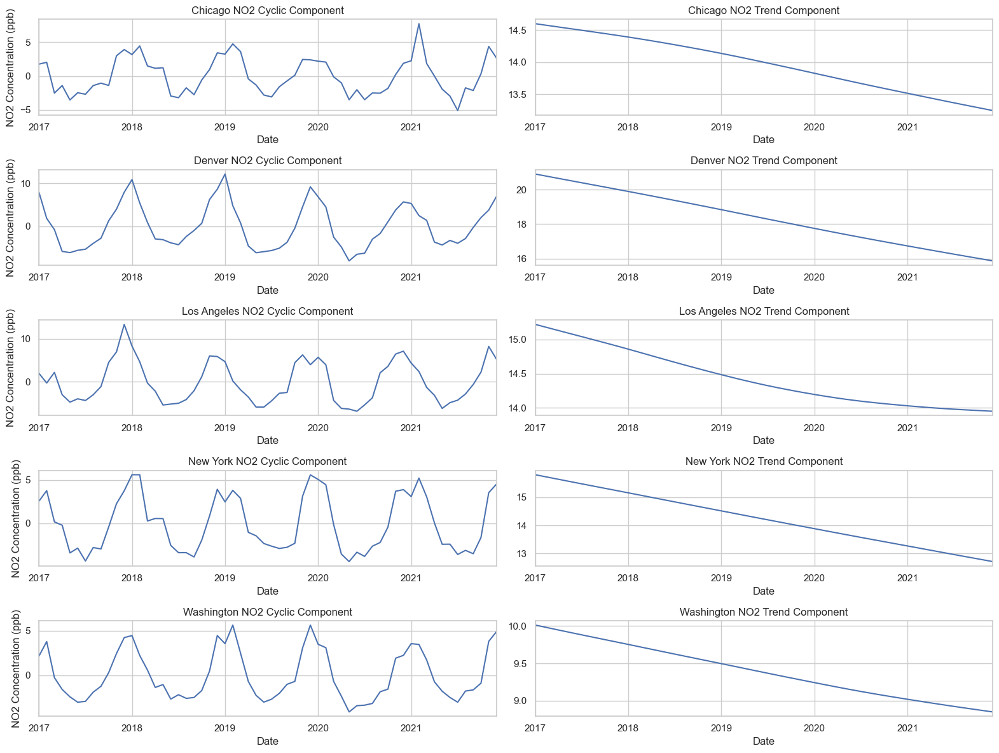

In [57]:
# Using Hodrick-Prescott filter

# Month Averaged Time Series Analysis
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(16, 12))
# Loop through each metro area and create a time series plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_month[avg_NO2_month['metro_area'] == metro_area]
    # Perform seasonal decomposition using STL
    NO2_cyclic, NO2_trend = hpfilter(metro_data['NO2_concentration'], lamb=129600)
    # Create a time series plot for the current metro area
    NO2_cyclic.plot(ax=axes[i,0], title=f'{metro_area} NO2 Cyclic Component', xlabel='Date')
    NO2_trend.plot(ax=axes[i,1], title=f'{metro_area} NO2 Trend Component', xlabel='Date')

    # Set the title and labels for each subplot
    axes[i,0].set_xlabel('Date')
    axes[i,0].set_ylabel('NO2 Concentration (ppb)')

# Tight layout for the subplots
plt.tight_layout()
plt.show()


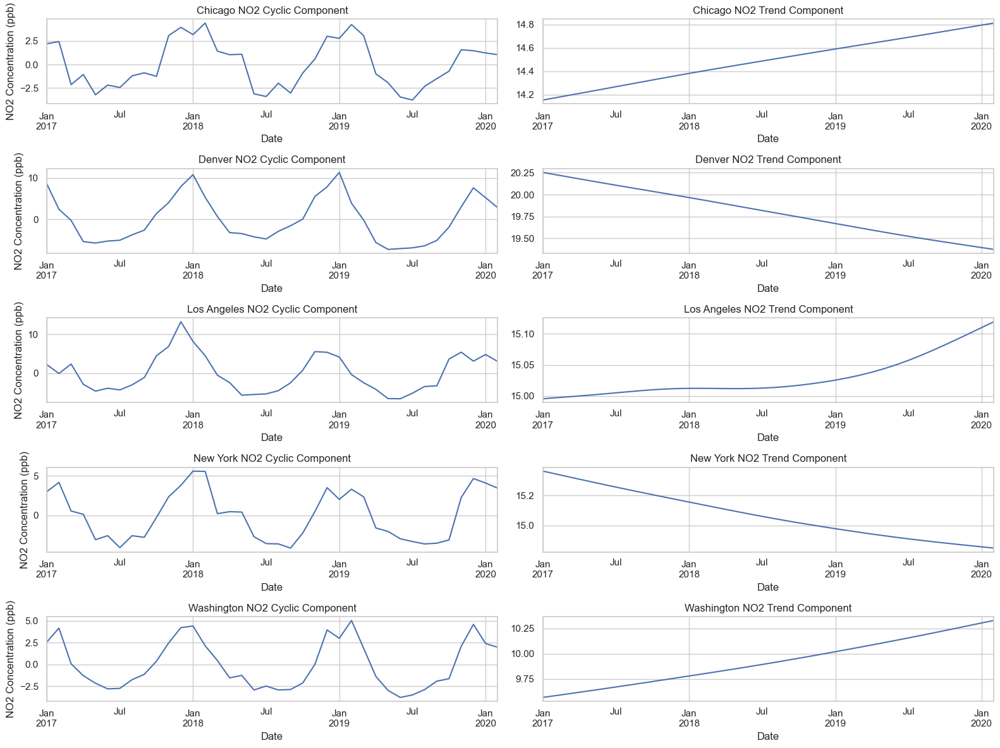

In [58]:
# Perform the same analysis but without the year 2020 and 2021
# Reset the index to a column
avg_NO2_month.reset_index(inplace=True)
avg_NO2_month_preC = avg_NO2_month[avg_NO2_month['month_year'] < '2020-03']
# Set the index to the month_year column
avg_NO2_month_preC.set_index('month_year', inplace=True)

# Month Averaged Time Series Analysis
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(16, 12))
# Loop through each metro area and create a time series plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = avg_NO2_month_preC[avg_NO2_month_preC['metro_area'] == metro_area]
    # Perform seasonal decomposition using STL
    NO2_cyclic, NO2_trend = hpfilter(metro_data['NO2_concentration'], lamb=129600)
    # Create a time series plot for the current metro area
    NO2_cyclic.plot(ax=axes[i,0], title=f'{metro_area} NO2 Cyclic Component', xlabel='Date')
    NO2_trend.plot(ax=axes[i,1], title=f'{metro_area} NO2 Trend Component', xlabel='Date')

    # Set the title and labels for each subplot
    axes[i,0].set_xlabel('Date')
    axes[i,0].set_ylabel('NO2 Concentration (ppb)')

# Tight layout for the subplots
plt.tight_layout()
plt.show()


# Weather Data Analysis

In [59]:
# Double check data
print(all_weather_data_daily.head())

print(all_weather_data_daily.info())

weather_columns = ['barometric_pressure', 'dew_point', 'outdoor_temperature', 'relative_humidity', 'wind_direction', 'wind_speed']


    fips   fips_site date_local  barometric_pressure  dew_point  \
0  06037  06037_0002 2017-01-01               991.46        NaN   
1  06037  06037_0002 2017-01-02               996.38        NaN   
2  06037  06037_0002 2017-01-03               998.62        NaN   
3  06037  06037_0002 2017-01-04               997.54        NaN   
4  06037  06037_0002 2017-01-05               993.46        NaN   

   outdoor_temperature  relative_humidity  wind_direction  wind_speed  \
0                50.51              72.50          147.08        2.35   
1                52.52              70.46          114.62        2.15   
2                52.75              65.25          122.25        2.67   
3                54.72              66.71          174.58        2.82   
4                56.01              98.58          166.42        2.33   

    metro_area  
0  Los Angeles  
1  Los Angeles  
2  Los Angeles  
3  Los Angeles  
4  Los Angeles  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95069 

### Missing Data

In [60]:
print(data_dictionary(all_weather_data_daily))
show(data_dictionary(all_weather_data_daily))


                           DataType  MissingVal  NUnique  Count
fips                       category           0       31  95069
fips_site                  category           0       70  95069
date_local           datetime64[ns]           0     1826  95069
barometric_pressure         float64       50013     9637  45056
dew_point                   float64       91818     1789   3251
outdoor_temperature         float64       10046    13159  85023
relative_humidity           float64       37813     8549  57256
wind_direction              float64       20846    24414  74223
wind_speed                  float64       20402     6521  74667
metro_area                 category           0        5  95069


### Display Summary Statistics for the Weather Data

In [61]:
# # Create temp df with metro area and weather data
temp_df = all_weather_data_daily[['metro_area', 'barometric_pressure', 'dew_point', 'outdoor_temperature', 'relative_humidity', 'wind_direction', 'wind_speed']]

# Group by metro area and calculate the mean and variance of the weather data
weather_summary = temp_df.groupby('metro_area').agg(['mean', 'std']).reset_index()
# Rename the columns for clarity
weather_summary.columns = ['metro_area'] + [f'{col}_{stat}' for col, stat in weather_summary.columns[1:]]
# Print the results
print(weather_summary.head(10))
show(weather_summary.head(10))


    metro_area  barometric_pressure_mean  barometric_pressure_std  \
0      Chicago                    993.21                     6.83   
1       Denver                    790.21                    48.95   
2  Los Angeles                    992.91                    25.56   
3     New York                  1,009.99                    13.13   
4   Washington                  1,010.44                     8.50   

   dew_point_mean  dew_point_std  outdoor_temperature_mean  \
0           40.23          19.54                     51.83   
1             NaN            NaN                     52.12   
2             NaN            NaN                     65.13   
3             NaN            NaN                     54.32   
4             NaN            NaN                     57.71   

   outdoor_temperature_std  relative_humidity_mean  relative_humidity_std  \
0                    18.57                   72.11                  13.37   
1                    17.82                   45.28        

In [62]:
# Drop the dew_point column from the weather data
all_weather_data_daily.drop(columns=['dew_point'], inplace=True)


### Display the shape of the weather data

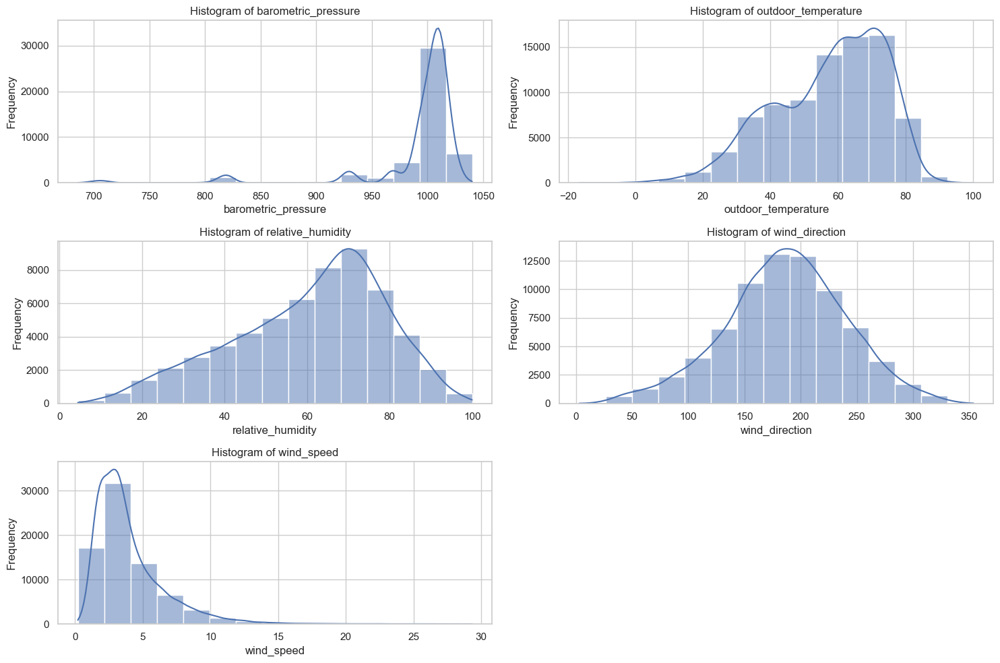

In [63]:
# List of columns to plot from the pivoted DataFrame
columns_to_plot = ['barometric_pressure', 'outdoor_temperature', 'relative_humidity', 'wind_direction', 'wind_speed']

# Create a 3 by 2 grid of subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 10))
# Flatten the axes array for easy indexing
axes = axes.flatten()
# Iterate through the columns and plot histograms
for i, col in enumerate(columns_to_plot):
    # Plot the histogram for each column
    sns.histplot(all_weather_data_daily[col], bins=15, kde=True, ax=axes[i])
    # Set the title and labels
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Remove the last empty subplot
axes[-1].axis('off')

# Adjust the layout
plt.tight_layout()
plt.show()


## Time series examination by weather

In [64]:
"""# For each metro area, create a time series plot of the weather data
for metro_area in all_weather_data_daily['metro_area'].unique():
    # Filter the data for the current metro area
    metro_data = all_weather_data_daily[all_weather_data_daily['metro_area'] == metro_area]
    # Create a time series plot for the current metro area
   
    # Create Weather Subplots
    fig, axes = plt.subplots(5, 1, figsize=(15, 15))
    # Loop through each weather column and create a time series plot
    for i, col in enumerate(columns_to_plot):
        # Create a time series plot for the current weather column
        sns.lineplot(data=metro_data, x='date_local', y=col, ax=axes[i])
        axes[i].set_title(f'{col} Over Time for {metro_area}', fontsize=16, loc='right')
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel(col)
        # Rotate the x-axis labels for better readability
        axes[i].tick_params(axis='x', rotation=45)
        # Set the x-axis limits to the date range of the data
        axes[i].set_xlim(metro_data['date_local'].min(), metro_data['date_local'].max())
        # Set the y-axis limits to the range of the data
        axes[i].set_ylim(metro_data[col].min(), metro_data[col].max())
        # Set the grid for better readability
        axes[i].grid(True)

    # Adjust the layout
    plt.tight_layout()
    plt.show()"""


"# For each metro area, create a time series plot of the weather data\nfor metro_area in all_weather_data_daily['metro_area'].unique():\n    # Filter the data for the current metro area\n    metro_data = all_weather_data_daily[all_weather_data_daily['metro_area'] == metro_area]\n    # Create a time series plot for the current metro area\n   \n    # Create Weather Subplots\n    fig, axes = plt.subplots(5, 1, figsize=(15, 15))\n    # Loop through each weather column and create a time series plot\n    for i, col in enumerate(columns_to_plot):\n        # Create a time series plot for the current weather column\n        sns.lineplot(data=metro_data, x='date_local', y=col, ax=axes[i])\n        axes[i].set_title(f'{col} Over Time for {metro_area}', fontsize=16, loc='right')\n        axes[i].set_xlabel('Date')\n        axes[i].set_ylabel(col)\n        # Rotate the x-axis labels for better readability\n        axes[i].tick_params(axis='x', rotation=45)\n        # Set the x-axis limits to the da

### Display Pair Plots for the Data

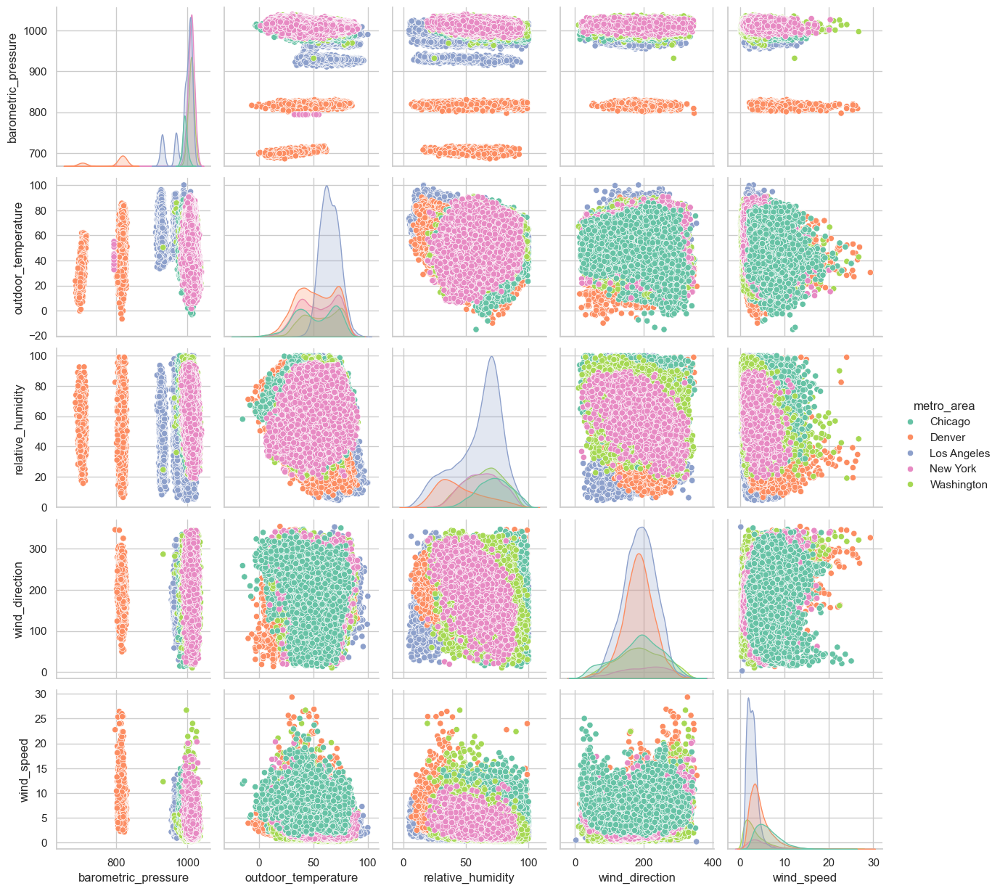

In [65]:
# Filter only the numerical columns for the pair-plot
pair_plot_data = all_weather_data_daily
# Create a pair-plot of the weather data
sns.pairplot(pair_plot_data, diag_kind='kde', hue='metro_area', palette='Set2')


### Conduct Correlation Analysis

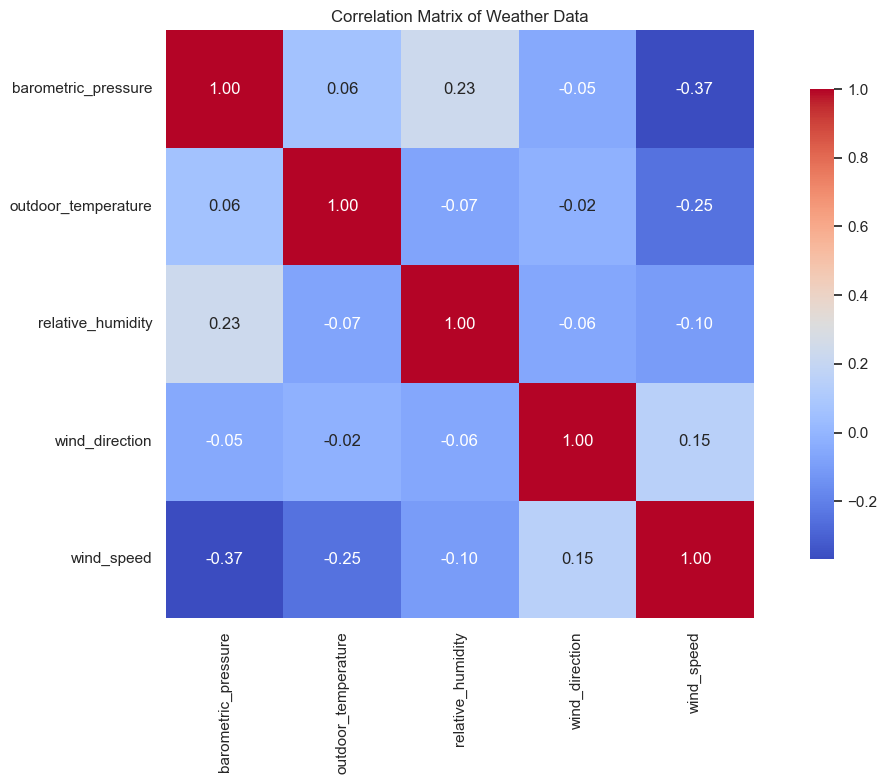

In [66]:
# Filter only the numerical columns for the correlation matrix
corr_data = all_weather_data_daily.select_dtypes(include=[np.number])
# Correlation matrix for the weather data
corr_matrix = corr_data.corr()

# Show the correlation matrix as a table
show(corr_matrix)

# Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Weather Data')
plt.tight_layout()
plt.show()


C:\Users\adams\AppData\Local\Temp\ipykernel_41476\323811934.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metro_data['date_local'] = pd.to_datetime(metro_data['date_local'])
C:\Users\adams\AppData\Local\Temp\ipykernel_41476\323811934.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  metro_data['date_local'] = pd.to_datetime(metro_data['date_local'])
C:\Users\adams\AppData\Local\Temp\ipykernel_41476\323811934.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Da

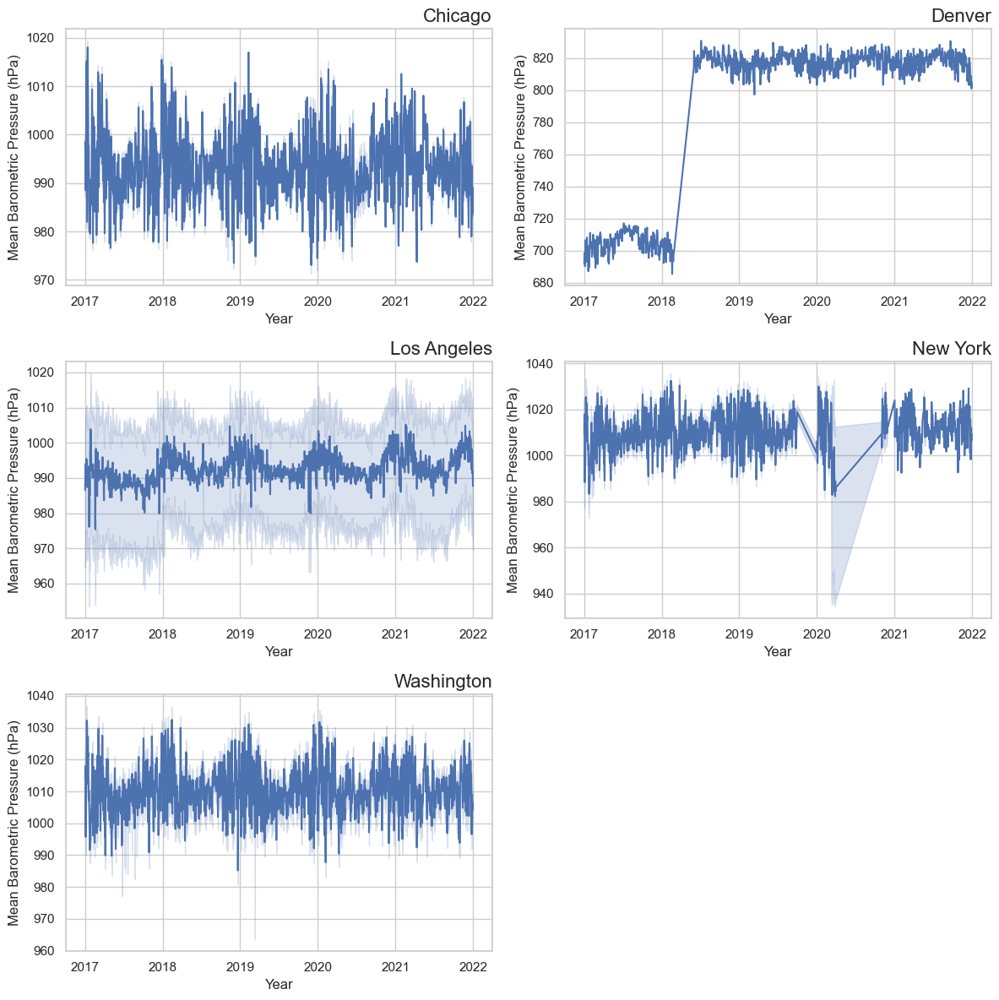

In [67]:
# Plot barometric by metro region in a 3x2 grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
# Flatten the axes array for easier indexing
axes = axes.flatten()
# Loop through each metro area and create a bar-plot
for i, metro_area in enumerate(metro_areas):
    # Filter the data for the current metro area
    metro_data = all_weather_data_daily[all_weather_data_daily['metro_area'] == metro_area]
    # Create a line-plot for the current metro area
    # Convert the date column to datetime format
    metro_data['date_local'] = pd.to_datetime(metro_data['date_local'])
    # Create a time series plot for the current metro area
    sns.lineplot(data=metro_data, x='date_local', y='barometric_pressure', ax=axes[i])
    axes[i].set_title(f'{metro_area}', fontsize=16, loc='right')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Mean Barometric Pressure (hPa)')

# Remove the last empty subplot
axes[-1].axis('off')
plt.tight_layout()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


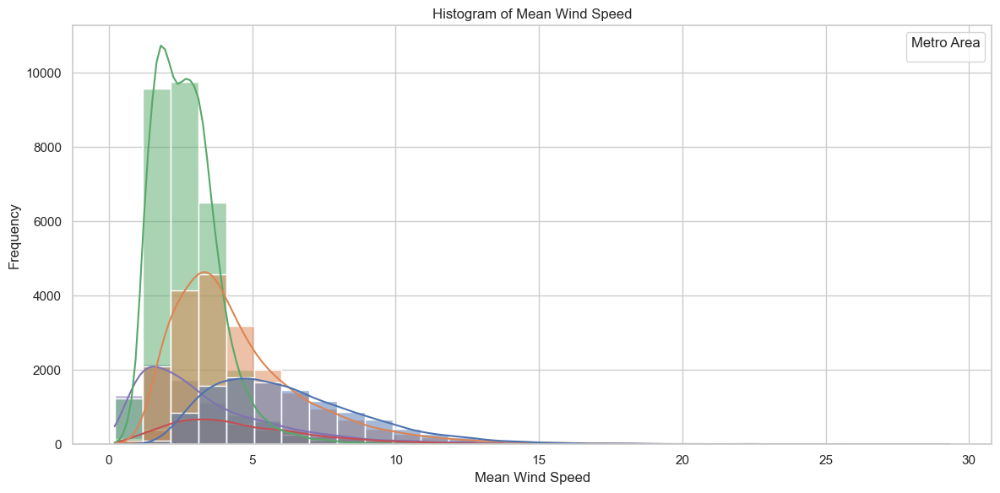

In [68]:
# Create a histogram of mean wind speed
plt.figure(figsize=(12, 6))
sns.histplot(data=all_weather_data_daily, x='wind_speed', hue='metro_area', bins=30, kde=True)
plt.title('Histogram of Mean Wind Speed')
plt.xlabel('Mean Wind Speed')
plt.ylabel('Frequency')
plt.legend(title='Metro Area')
plt.tight_layout()



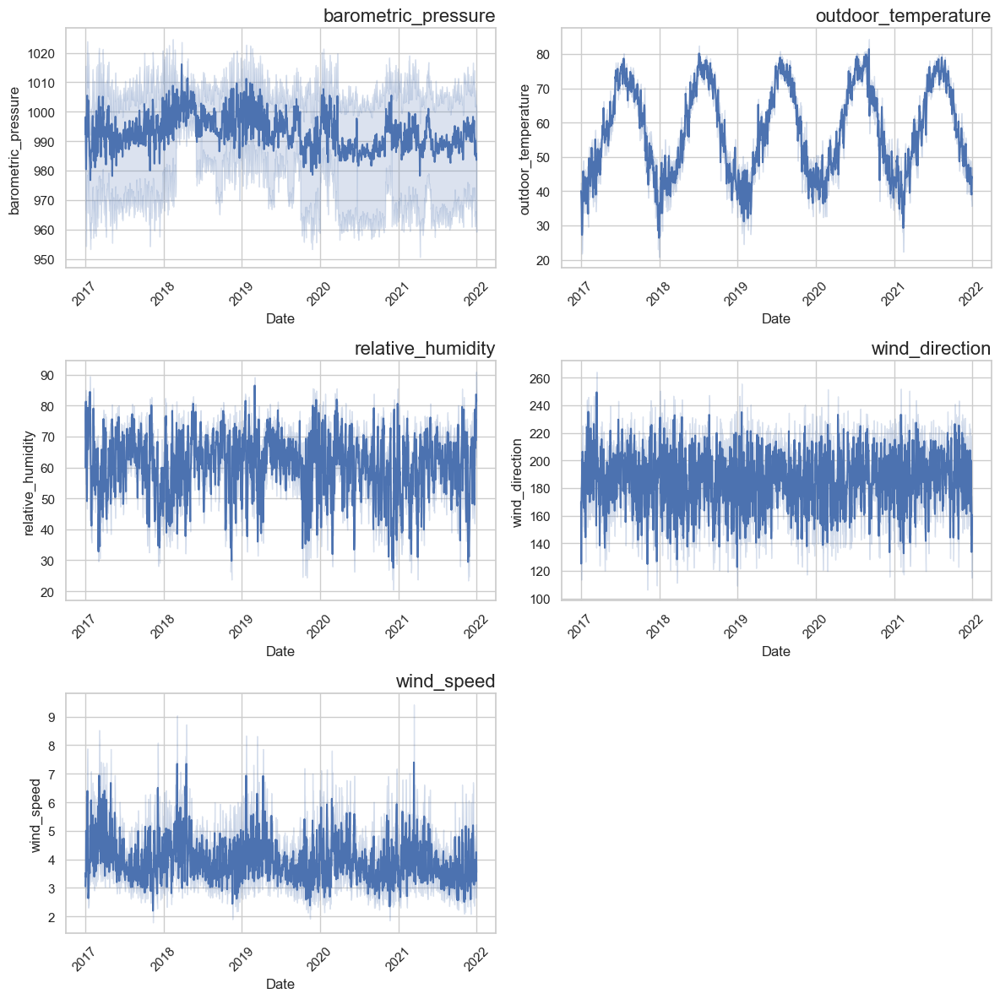

In [69]:
# Create a 3x2 grid of subplots for the weather data
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
# Flatten the axes array for easier indexing
axes = axes.flatten()
# Loop through each weather variable and create a line-plot
for i, col in enumerate(columns_to_plot):
    # Create a line-plot for the current weather variable
    sns.lineplot(data=all_weather_data_daily, x='date_local', y=col, ax=axes[i])
    axes[i].set_title(f'{col}', fontsize=16, loc='right')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel(col)

    # Rotate the x-axis labels for better readability
    axes[i].tick_params(axis='x', rotation=45)

# Remove the last empty subplot
axes[-1].axis('off')
plt.tight_layout()
plt.show()


## Merge the $NO_2$ Data with the Weather Data

In [70]:
# Merge the NO2 and weather data on fips, fips_site, metro_area and date_local
merged_data = pd.merge(avg_NO2_daily, all_weather_data_daily, on=['fips', 'fips_site', 'metro_area', 'date_local'], how='inner')
# Check the merged data
#print(merged_data.head())
# Check the merged data info
#print(merged_data.info()) 

# Check the merged data dictionary
print(data_dictionary(merged_data))


                           DataType  MissingVal  NUnique  Count
date_local           datetime64[ns]           0     1826  55569
fips                         object           0       17  55569
fips_site                    object           0       41  55569
latitude                    float32           0       41  55569
longitude                   float32           0       41  55569
NO2_concentration           float32           0    19653  55569
metro_area                 category           0        5  55569
month_year                period[M]           0       60  55569
year                          int32           0        5  55569
week_of_year                 UInt32           0       53  55569
day_of_year                   int32           0      366  55569
day_of_week                  object           0        7  55569
day_of_week_num               int32           0        7  55569
day_of_week_sin             float64           0        7  55569
day_of_week_cos             float64     

In [71]:
# fill the missing values with the nearest value
merged_data.fillna(method='ffill', inplace=True)
# Check the merged data for missing values
print(data_dictionary(merged_data))


                           DataType  MissingVal  NUnique  Count
date_local           datetime64[ns]           0     1826  55569
fips                         object           0       17  55569
fips_site                    object           0       41  55569
latitude                    float32           0       41  55569
longitude                   float32           0       41  55569
NO2_concentration           float32           0    19653  55569
metro_area                 category           0        5  55569
month_year                period[M]           0       60  55569
year                          int32           0        5  55569
week_of_year                 UInt32           0       53  55569
day_of_year                   int32           0      366  55569
day_of_week                  object           0        7  55569
day_of_week_num               int32           0        7  55569
day_of_week_sin             float64           0        7  55569
day_of_week_cos             float64     

In [72]:
# Add the logarithm of the NO2 concentrations to the merged data
merged_data['NO2_log'] = np.log(merged_data['NO2_concentration'])
# Add the lorarith of the wind speed 
merged_data['wind_speed_log'] = np.log(merged_data['wind_speed'])


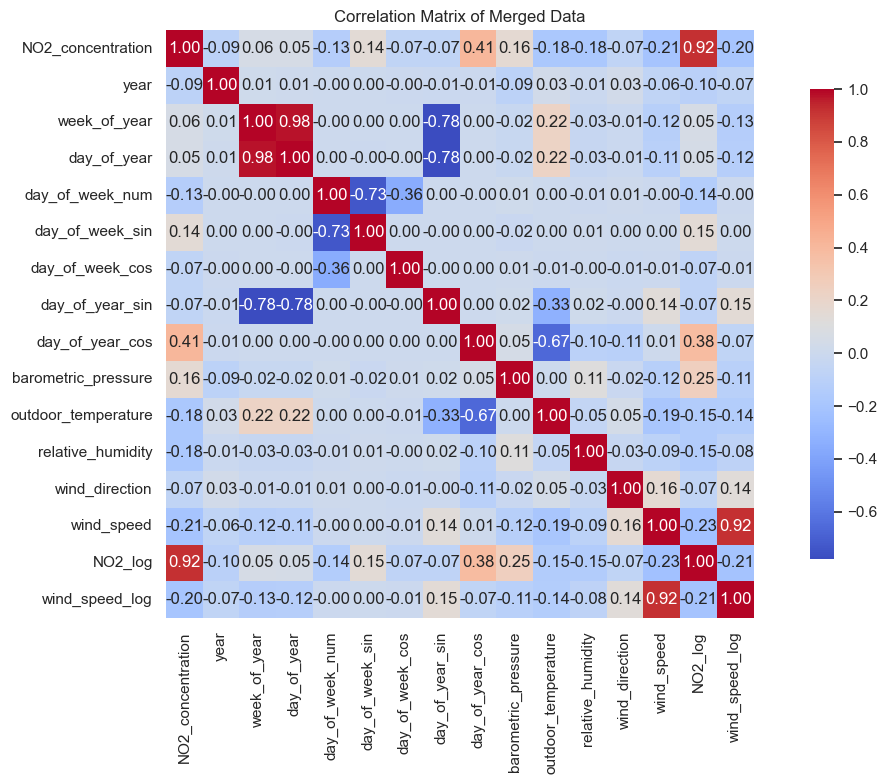

In [73]:
# Create correlation matrix for the merged data
corr_data = merged_data.select_dtypes(include=[np.number])
# Drop longitude and latitude columns
corr_data.drop(columns=['longitude', 'latitude'], inplace=True)

corr_matrix = corr_data.corr()
# Show the correlation matrix as a table
show(corr_matrix)
# Plot the correlation matrix using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix of Merged Data')
plt.tight_layout()
plt.show()


In [74]:
"""# For each metro area, create a time series plot of the weather data
for metro_area in merged_data['metro_area'].unique():
    # Filter the data for the current metro area
    metro_data = merged_data[merged_data['metro_area'] == metro_area]
    # Create a time series plot for the current metro area
   
    # Create Weather Subplots
    fig, axes = plt.subplots(5, 1, figsize=(15, 15))
    # Loop through each weather column and create a time series plot
    for i, col in enumerate(columns_to_plot):
        # Create a time series plot for the current weather column
        sns.lineplot(data=metro_data, x='date_local', y=col, ax=axes[i])
        axes[i].set_title(f'{col} Over Time for {metro_area}', fontsize=16, loc='right')
        axes[i].set_xlabel('Date')
        axes[i].set_ylabel(col)
        # Rotate the x-axis labels for better readability
        axes[i].tick_params(axis='x', rotation=45)
        # Set the x-axis limits to the date range of the data
        axes[i].set_xlim(metro_data['date_local'].min(), metro_data['date_local'].max())
        # Set the y-axis limits to the range of the data
        axes[i].set_ylim(metro_data[col].min(), metro_data[col].max())
        # Set the grid for better readability
        axes[i].grid(True)

    # Adjust the layout
    plt.tight_layout()
    plt.show()"""


"# For each metro area, create a time series plot of the weather data\nfor metro_area in merged_data['metro_area'].unique():\n    # Filter the data for the current metro area\n    metro_data = merged_data[merged_data['metro_area'] == metro_area]\n    # Create a time series plot for the current metro area\n   \n    # Create Weather Subplots\n    fig, axes = plt.subplots(5, 1, figsize=(15, 15))\n    # Loop through each weather column and create a time series plot\n    for i, col in enumerate(columns_to_plot):\n        # Create a time series plot for the current weather column\n        sns.lineplot(data=metro_data, x='date_local', y=col, ax=axes[i])\n        axes[i].set_title(f'{col} Over Time for {metro_area}', fontsize=16, loc='right')\n        axes[i].set_xlabel('Date')\n        axes[i].set_ylabel(col)\n        # Rotate the x-axis labels for better readability\n        axes[i].tick_params(axis='x', rotation=45)\n        # Set the x-axis limits to the date range of the data\n        axe

### Scatter-plots for linear relationships

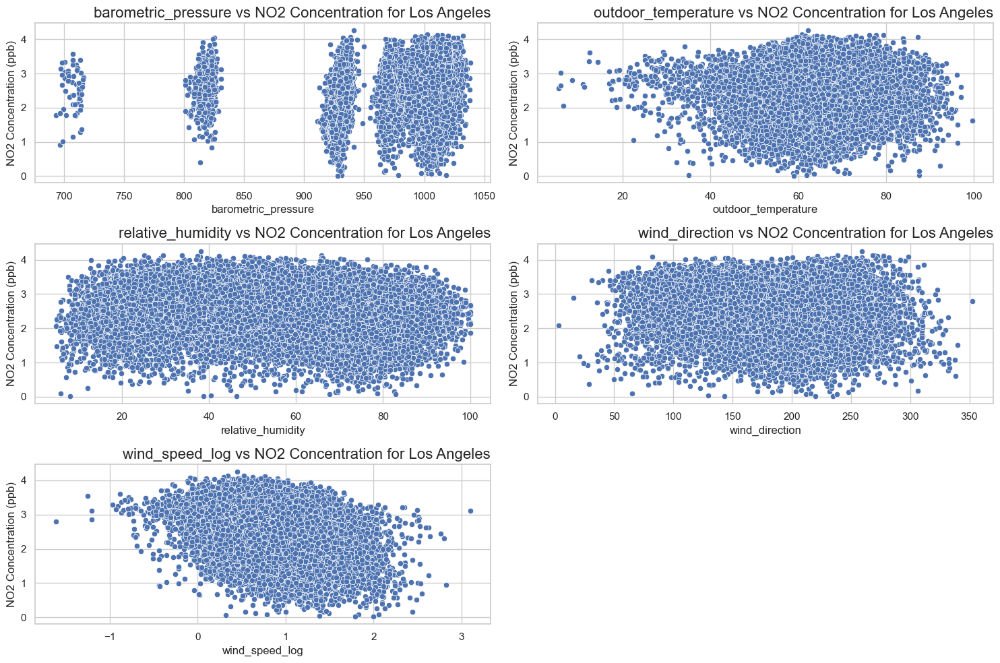

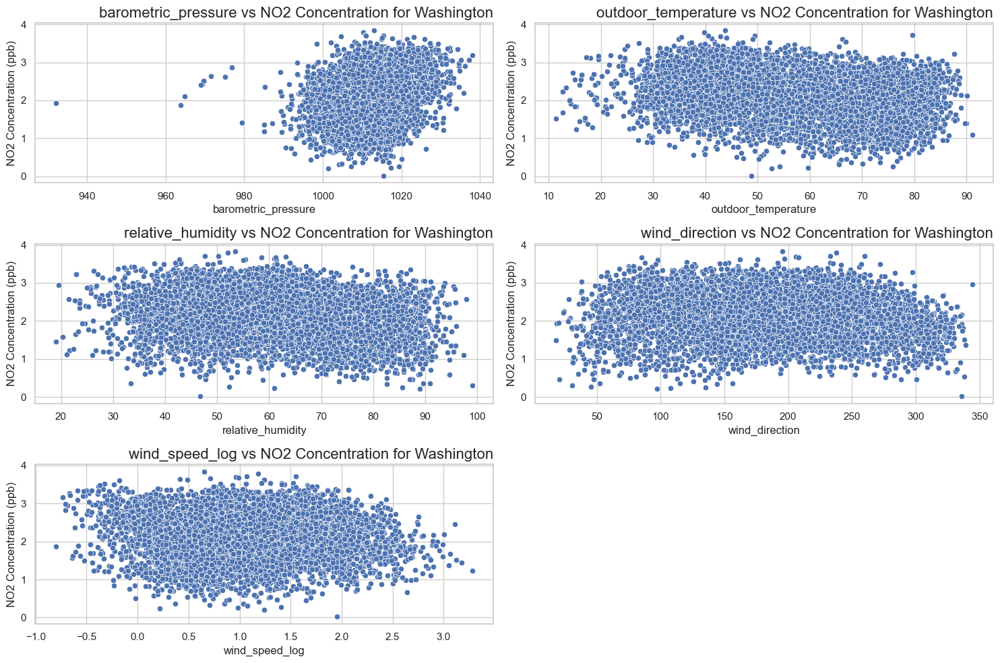

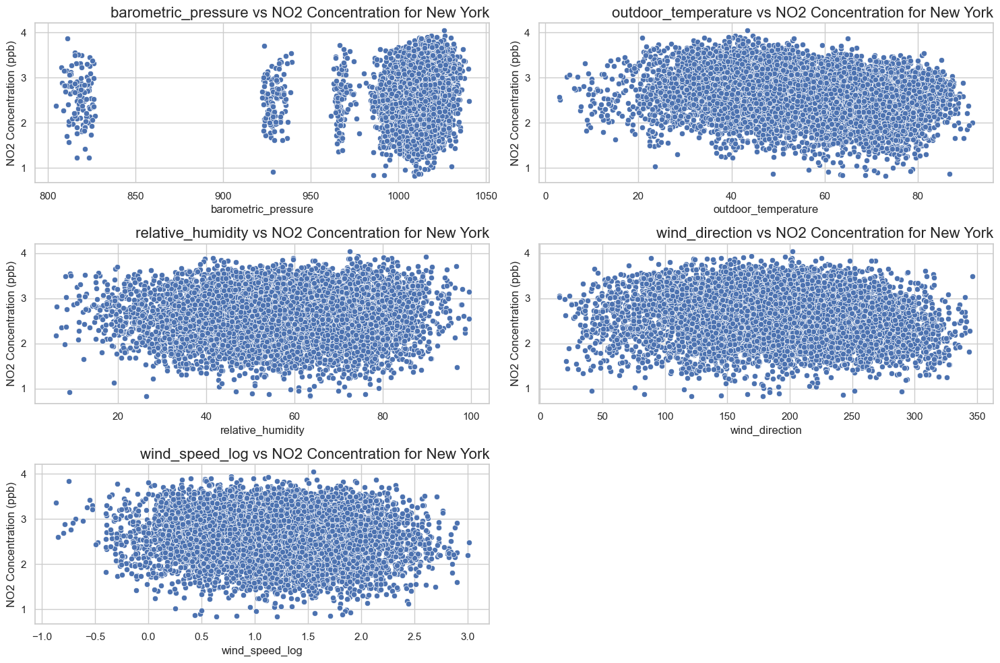

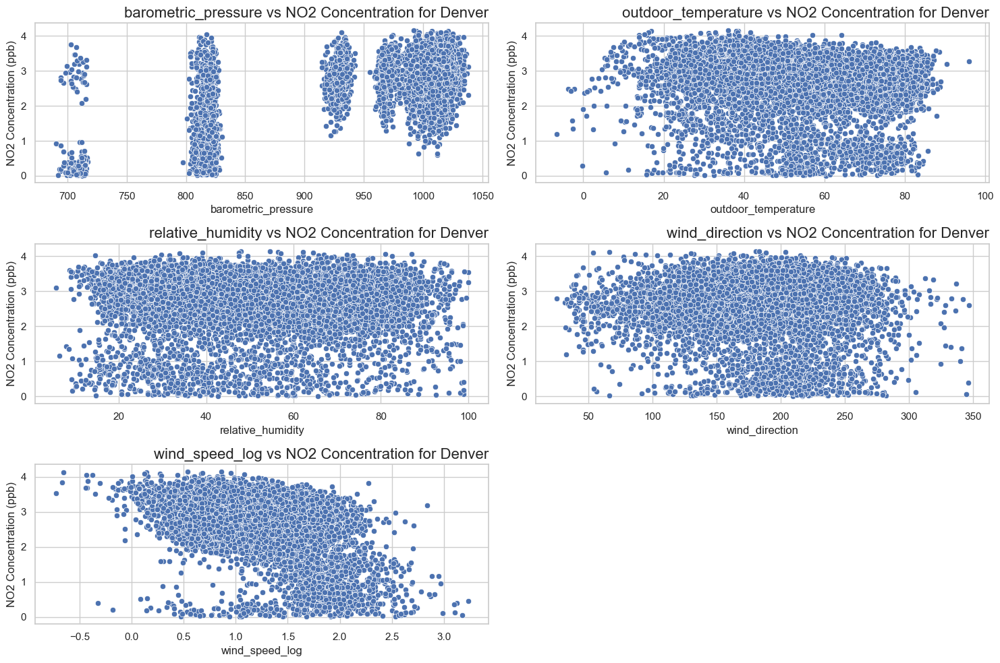

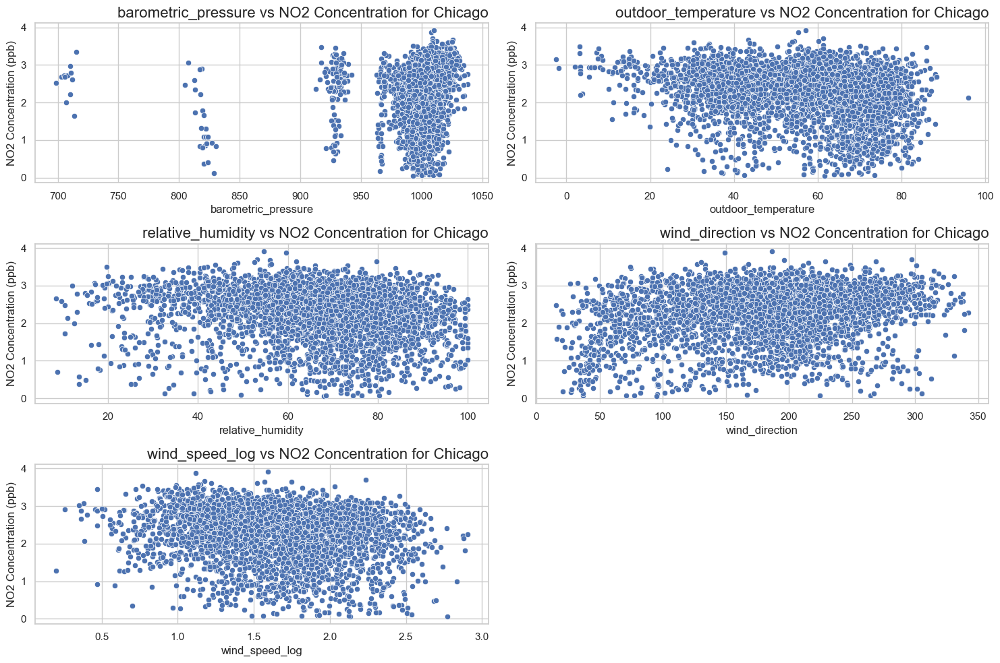

In [75]:
# List of columns to plot from the merged DataFrame
columns_to_plot = ['barometric_pressure', 'outdoor_temperature', 'relative_humidity', 'wind_direction', 'wind_speed_log']

# Plot the NO2 concentration vs all the weather variables is a 3x2 subplot grid
for metro_area in merged_data['metro_area'].unique():
    # Filter the data for the current metro area
    metro_data = merged_data[merged_data['metro_area'] == metro_area]
    # Create a 3x2 grid of subplots
    fig, axes = plt.subplots(3, 2, figsize=(15, 10))
    # Flatten the axes array for easier indexing
    axes = axes.flatten()
    # Loop through each weather variable and create a scatter-plot
    for i, col in enumerate(columns_to_plot):
        # Create a scatter-plot for the current weather variable
        sns.scatterplot(data=metro_data, x=col, y='NO2_log', ax=axes[i])
        axes[i].set_title(f'{col} vs NO2 Concentration for {metro_area}', fontsize=16, loc='right')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('NO2 Concentration (ppb)')

    # Remove the last empty subplot
    axes[-1].axis('off')
    plt.tight_layout()
    plt.show()
